In [1]:
%matplotlib inline
import os
import argparse
import time
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim

#parser = argparse.ArgumentParser('ODE demo')
#parser.add_argument('--method', type=str, choices=['dopri5', 'adams'], default='dopri5')
#parser.add_argument('--data_size', type=int, default=1000)
#parser.add_argument('--batch_time', type=int, default=10)
#parser.add_argument('--batch_size', type=int, default=20)
#parser.add_argument('--niters', type=int, default=2000)
#parser.add_argument('--test_freq', type=int, default=20)
#parser.add_argument('--viz', action='store_true')
#parser.add_argument('--gpu', type=int, default=0)
#parser.add_argument('--adjoint', action='store_true')
#args = parser.parse_args()

batch_size = 100
batch_time = 10
data_size = 5000
niters = 2000
test_freq = 5000

from torchdiffeq import odeint_adjoint as odeint
#from torchdiffeq import odeint

device = torch.device(
    "cuda" if torch.cuda.is_available() else 
    "mps" if torch.backends.mps.is_available() else "cpu"
)
device = "cpu"
print(f"Device: {device}")

Device: cpu


In [2]:
true_y0 = torch.tensor([[0., 0.2856]]).to(device)   # начальные условия
t = torch.linspace(0., 100., data_size).to(device) # время t
true_A = torch.tensor([[-0.1, 2.0], [-2.0, -0.1]]).to(device)

# параметры модели
a = 1.04
c = 1.
alfa = 0.1
beta = 0.25

class Lambda(nn.Module):

    def forward(self, t, y):
        #print(y)
        x1 = y[0][0]
        x2 = y[0][1]
        #return torch.mm(y**3, true_A) # матр. умножение y**3 на true_A
        return torch.tensor([[
    (-alfa*((x1**2+x2**2)**2-2*c**2*(x1**2-x2**2)+c**4-a**4)*
     x1*(x1**2+x2**2-c**2)+beta*x2*(x1**2+x2**2+c**2))/
      np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2),
    (-alfa*((x1**2+x2**2)**2-2*c**2*(x1**2-x2**2)+c**4-a**4)*
     x2*(x1**2+x2**2+c**2)-beta*x1*(x1**2+x2**2-c**2))/
      np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2)
  ]])

In [3]:
with torch.no_grad():
    true_y = odeint(Lambda(), true_y0, t, method='dopri5')


def get_batch():
    s = torch.from_numpy(np.random.choice(
        np.arange(data_size - batch_time, dtype=np.int64), batch_size, replace=False))
    batch_y0 = true_y[s]  # (M, D)
    batch_t = t[:batch_time]  # (T)
    batch_y = torch.stack([true_y[s + i] for i in range(batch_time)], dim=0)  # (T, M, D)
    return batch_y0.to(device), batch_t.to(device), batch_y.to(device)

/var/folders/17/3qzjrpyx1m3fyc0k390k2l940000gp/T/ipykernel_52996/3342478953.py:21: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2),
/var/folders/17/3qzjrpyx1m3fyc0k390k2l940000gp/T/ipykernel_52996/3342478953.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2)


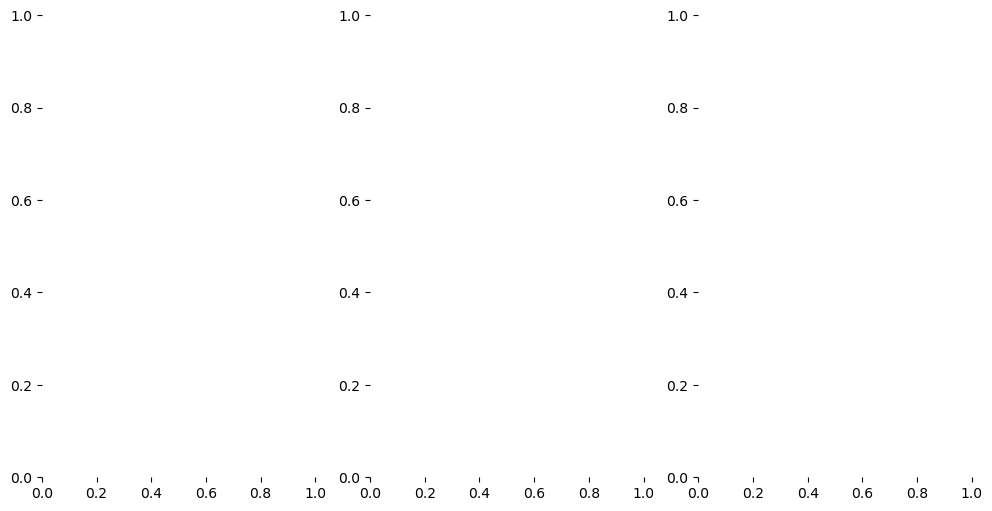

In [4]:
def makedirs(dirname):
    if not os.path.exists(dirname):
        os.makedirs(dirname)

makedirs('png')
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(12, 6), facecolor='white')
ax_traj = fig.add_subplot(131, frameon=False)
ax_phase = fig.add_subplot(132, frameon=False)
ax_vecfield = fig.add_subplot(133, frameon=False)
plt.show(block=False)

In [5]:
def visualize(true_y, pred_y, odefunc, itr):

    fig = plt.figure(figsize=(12, 6), facecolor='white')
    ax_traj = fig.add_subplot(131, frameon=False)
    ax_phase = fig.add_subplot(132, frameon=False)
    ax_vecfield = fig.add_subplot(133, frameon=False)
    
    ax_traj.cla()
    ax_traj.set_title('Траектории')
    ax_traj.set_xlabel('t')
    ax_traj.set_ylabel(r'$x_1,x_2$')
    ax_traj.plot(t.cpu().numpy(), true_y.cpu().numpy()[:, 0, 0], 
                 t.cpu().numpy(), true_y.cpu().numpy()[:, 0, 1], 
                 'g-',label="Истина")
    ax_traj.plot(t.cpu().numpy(), pred_y.cpu().numpy()[:, 0, 0], '--', 
                 t.cpu().numpy(), pred_y.cpu().numpy()[:, 0, 1], 'b--',
                label="Прогноз")
    ax_traj.set_xlim(t.cpu().min(), t.cpu().max())
    ax_traj.set_ylim(-2, 2)
    ax_traj.legend()

    ax_phase.cla()
    ax_phase.set_title('Фазовый портрет')
    ax_phase.set_xlabel(r'$x_1$')
    ax_phase.set_ylabel(r'$x_2$')
    ax_phase.plot(true_y.cpu().numpy()[:, 0, 0], 
                  true_y.cpu().numpy()[:, 0, 1], 'g-')
    ax_phase.plot(pred_y.cpu().numpy()[:, 0, 0], 
                  pred_y.cpu().numpy()[:, 0, 1], 'b--')
    ax_phase.set_xlim(-2, 2)
    ax_phase.set_ylim(-1, 1)

    ax_vecfield.cla()
    ax_vecfield.set_title('Изученное векторное поле')
    ax_vecfield.set_xlabel(r'$x_1$')
    ax_vecfield.set_ylabel(r'$x_2$')

    y, x = np.mgrid[-2:2:21j, -2:2:21j]
    dydt = odefunc(0, torch.Tensor(np.stack([x, y], -1).reshape(21 * 21, 2)).to(device)).cpu().detach().numpy()
    mag = np.sqrt(dydt[:, 0]**2 + dydt[:, 1]**2).reshape(-1, 1)
    dydt = (dydt / mag)
    dydt = dydt.reshape(21, 21, 2)

    ax_vecfield.streamplot(x, y, dydt[:, :, 0], dydt[:, :, 1], color="black")
    ax_vecfield.set_xlim(-2, 2)
    ax_vecfield.set_ylim(-1, 1)

    fig.tight_layout()
    plt.savefig('png/{:03d}'.format(itr))
    plt.draw()
    plt.pause(0.001)

In [6]:
class ODEFunc(nn.Module):

    def __init__(self):
        super(ODEFunc, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 2),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean=0, std=0.1)
                nn.init.constant_(m.bias, val=0)

    def forward(self, t, y):
        return self.net(y) # **3

In [7]:
class RunningAverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self, momentum=0.99):
        self.momentum = momentum
        self.reset()

    def reset(self):
        self.val = None
        self.avg = 0

    def update(self, val):
        if self.val is None:
            self.avg = val
        else:
            self.avg = self.avg * self.momentum + val * (1 - self.momentum)
        self.val = val

Best model on Iter 0001 with loss 0.016547
Iter 0001 | Total Loss 16.018013


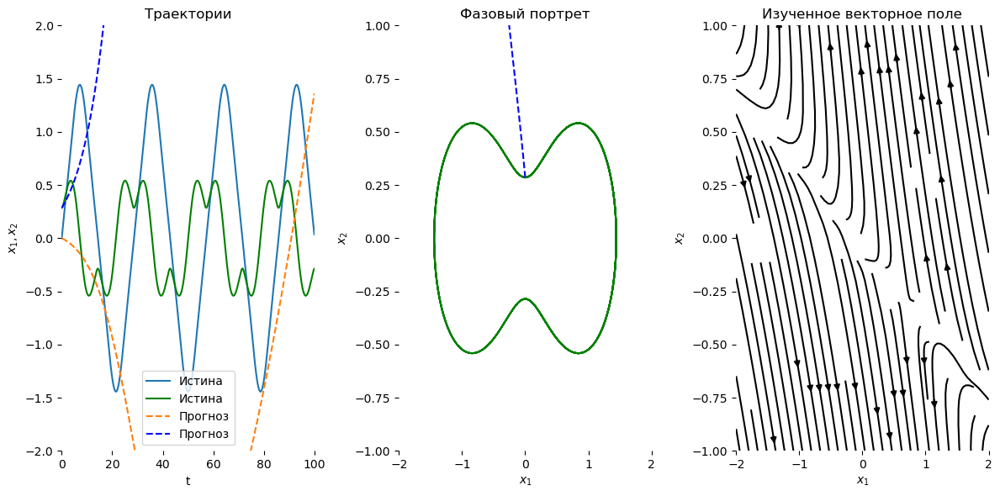

Best model on Iter 0003 with loss 0.015992
Iter 0003 | Total Loss 16.912519


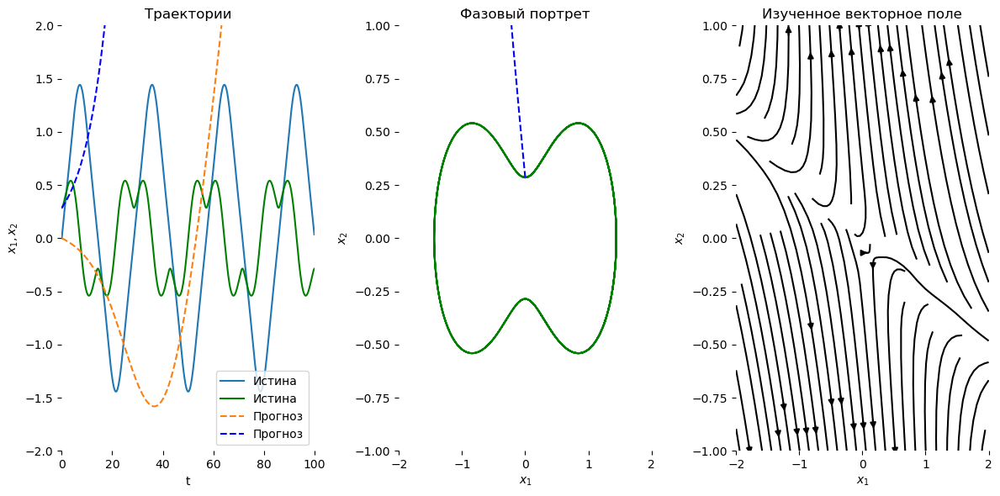

Best model on Iter 0004 with loss 0.015763
Iter 0004 | Total Loss 17.274431


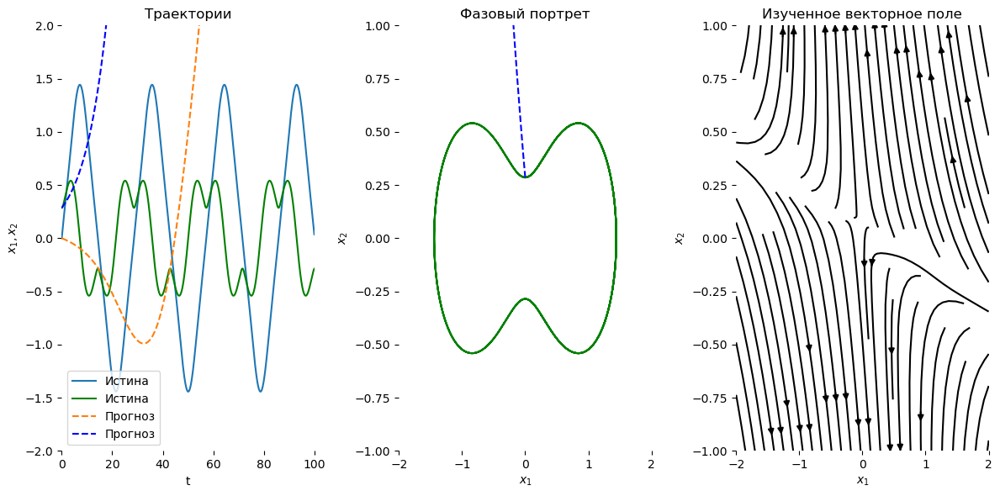

Best model on Iter 0006 with loss 0.015546
Iter 0006 | Total Loss 18.015631


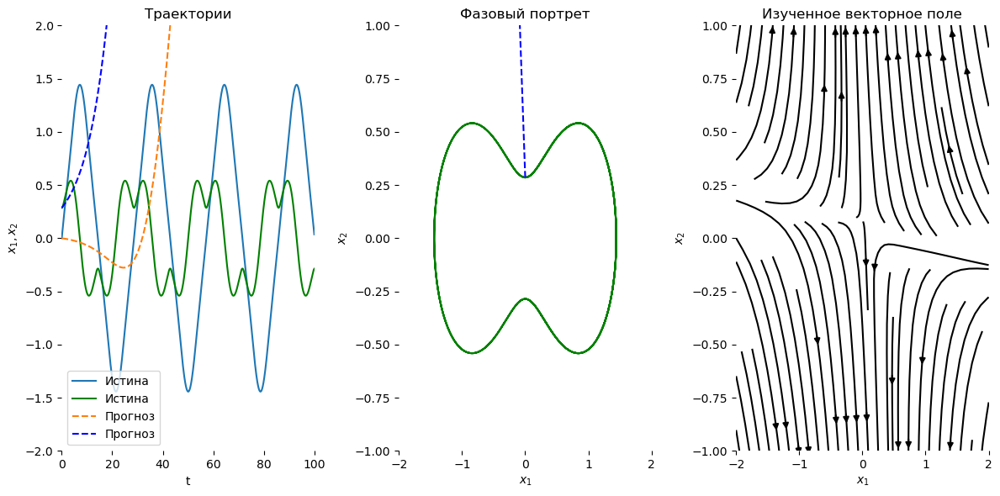

Best model on Iter 0007 with loss 0.015265
Iter 0007 | Total Loss 18.095716


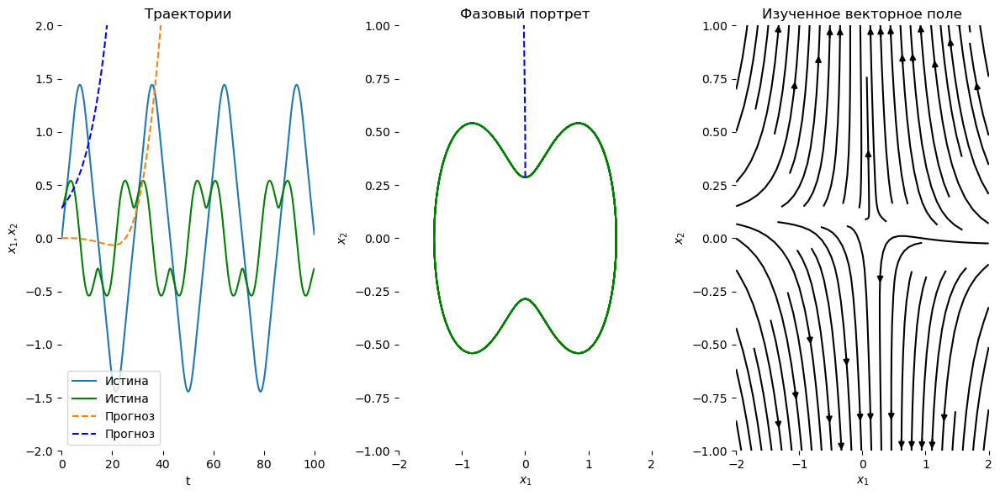

Best model on Iter 0008 with loss 0.014873
Iter 0008 | Total Loss 17.725298


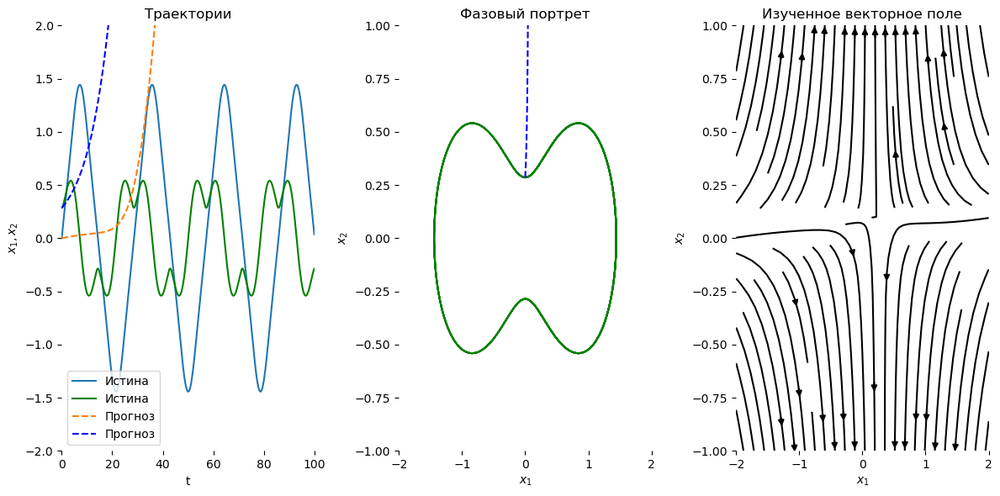

Best model on Iter 0009 with loss 0.014558
Iter 0009 | Total Loss 17.189796


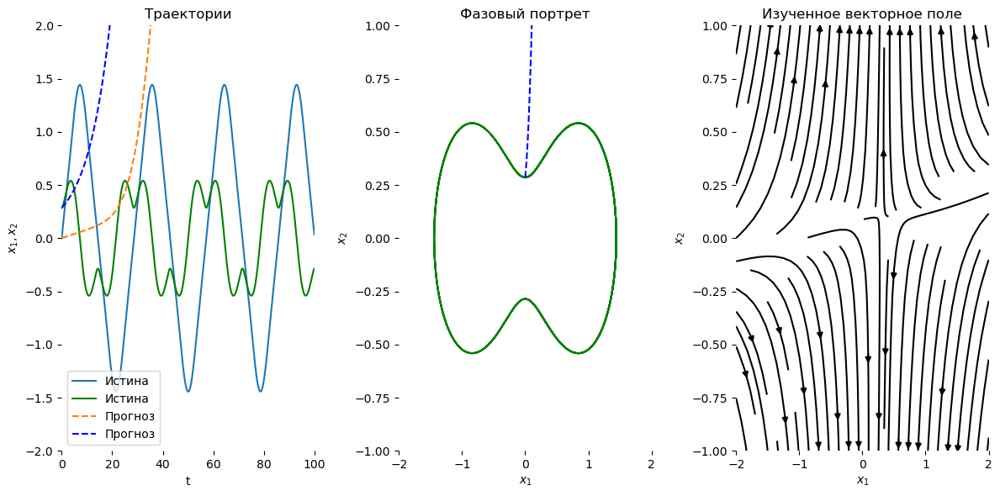

Best model on Iter 0010 with loss 0.013959
Iter 0010 | Total Loss 16.326668


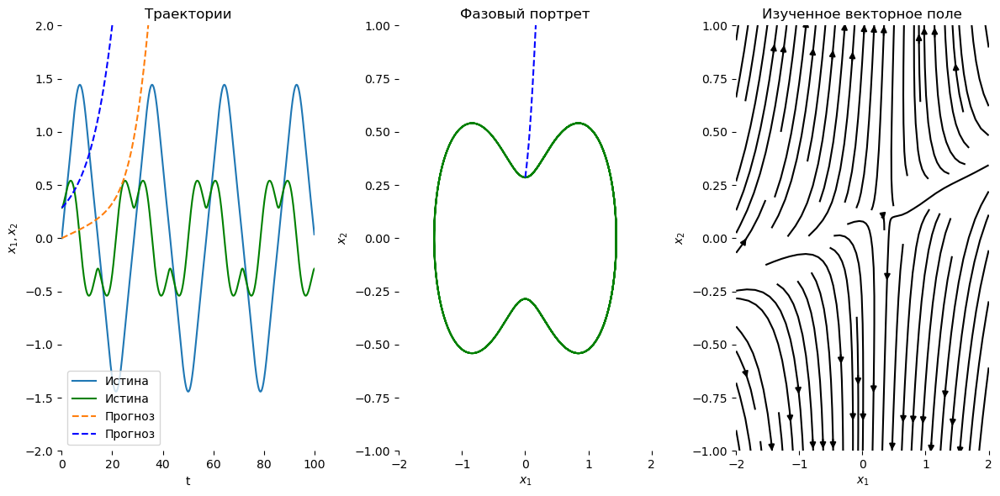

Best model on Iter 0011 with loss 0.013270
Iter 0011 | Total Loss 14.995747


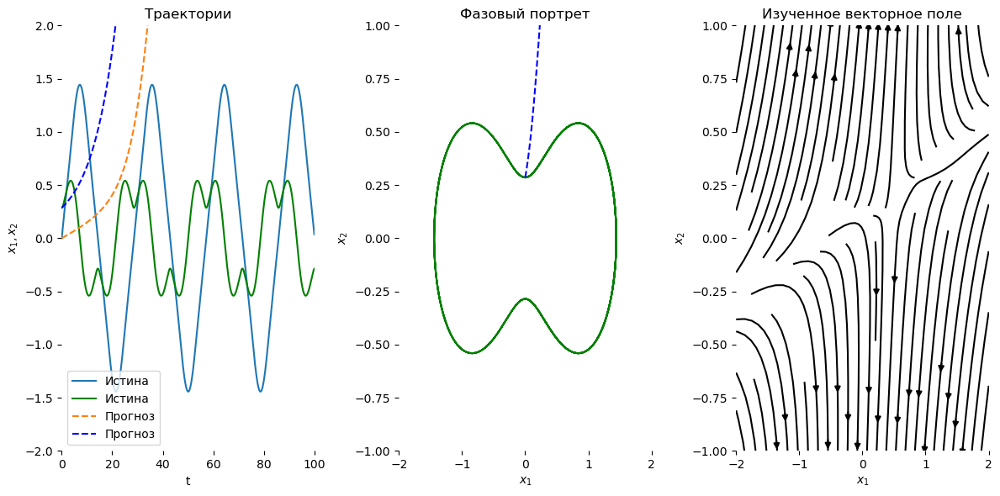

Best model on Iter 0015 with loss 0.012568
Iter 0015 | Total Loss 2.992963


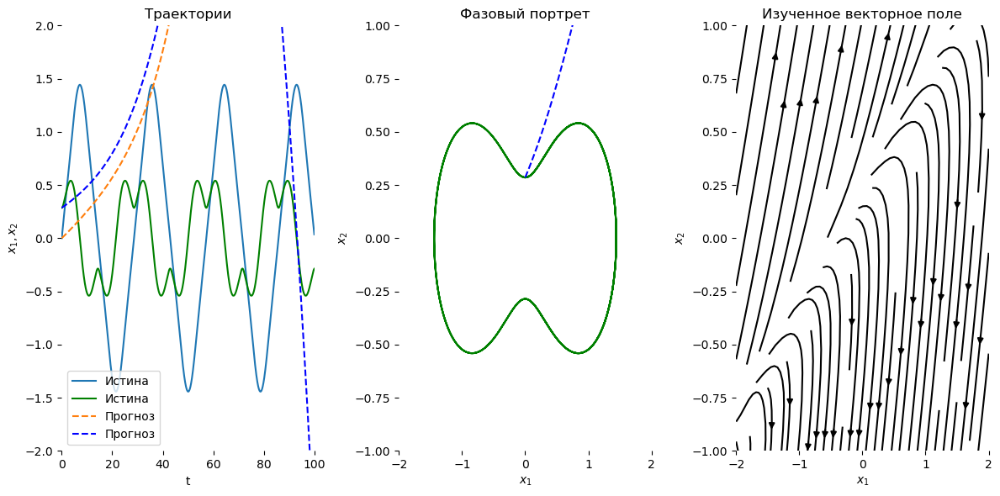

Best model on Iter 0017 with loss 0.012391
Iter 0017 | Total Loss 3.454995


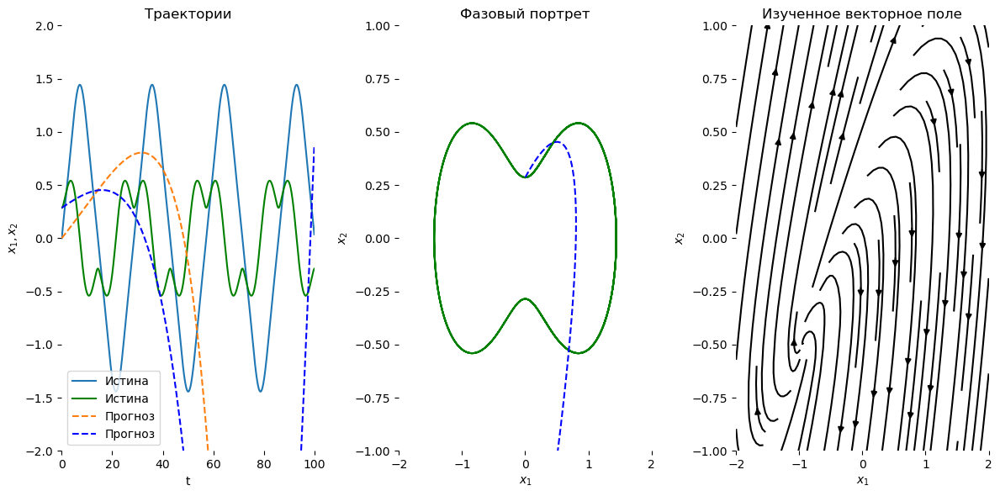

Best model on Iter 0019 with loss 0.012151
Iter 0019 | Total Loss 3.018502


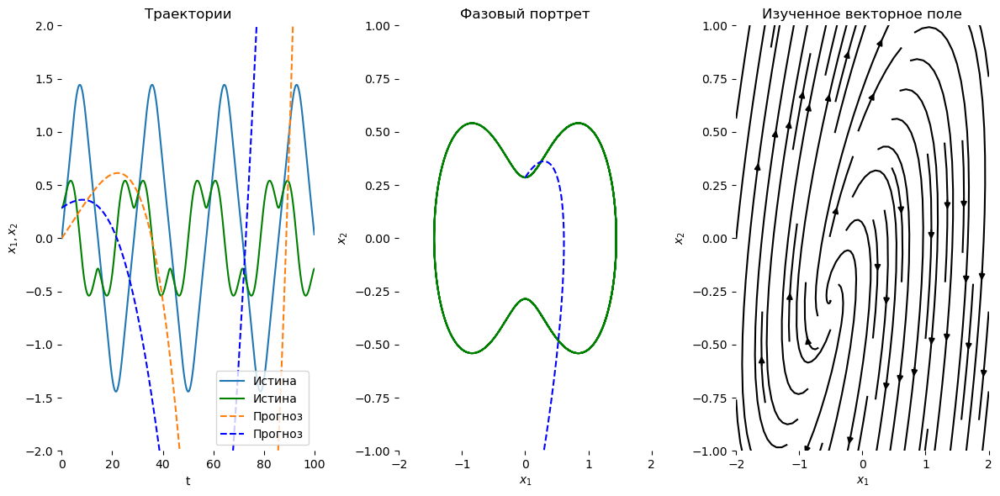

Best model on Iter 0020 with loss 0.011886
Iter 0020 | Total Loss 3.359743


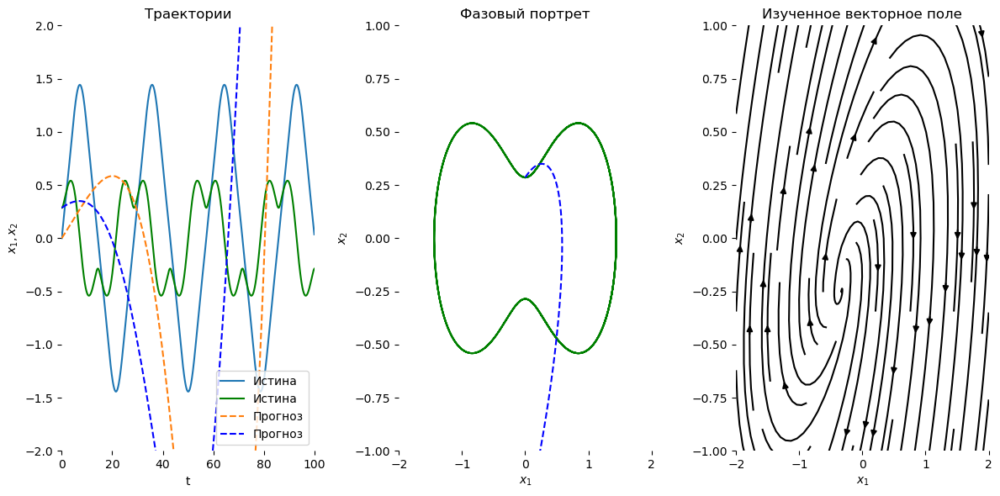

Best model on Iter 0021 with loss 0.011816
Iter 0021 | Total Loss 3.331966


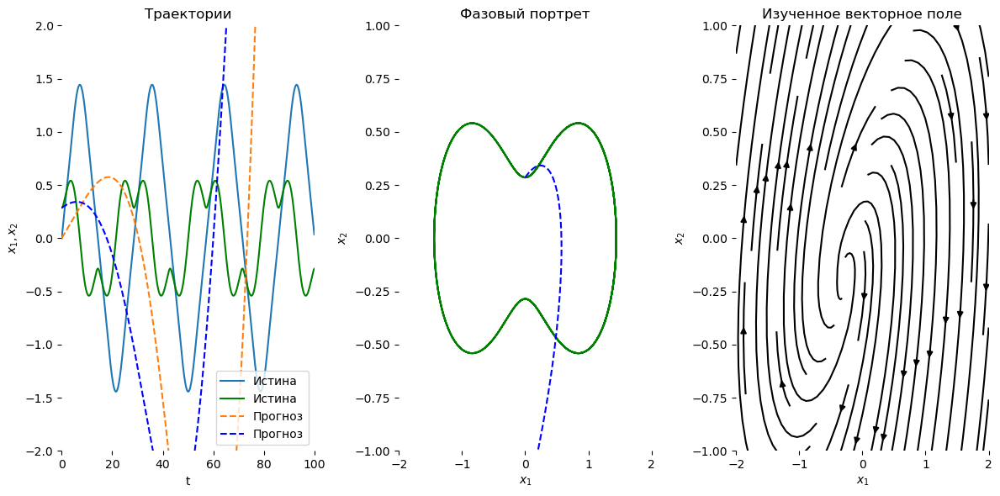

Best model on Iter 0022 with loss 0.011211
Iter 0022 | Total Loss 2.966886


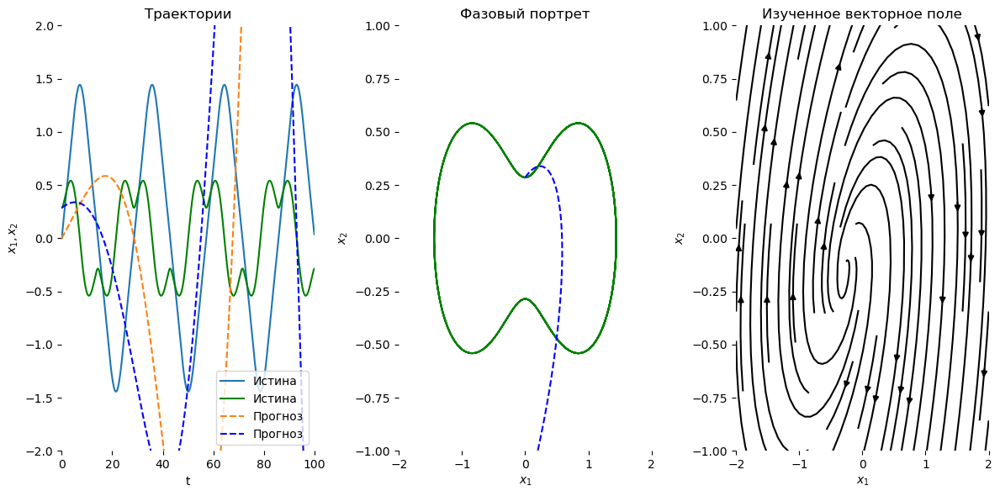

Best model on Iter 0026 with loss 0.010700
Iter 0026 | Total Loss 3.024743


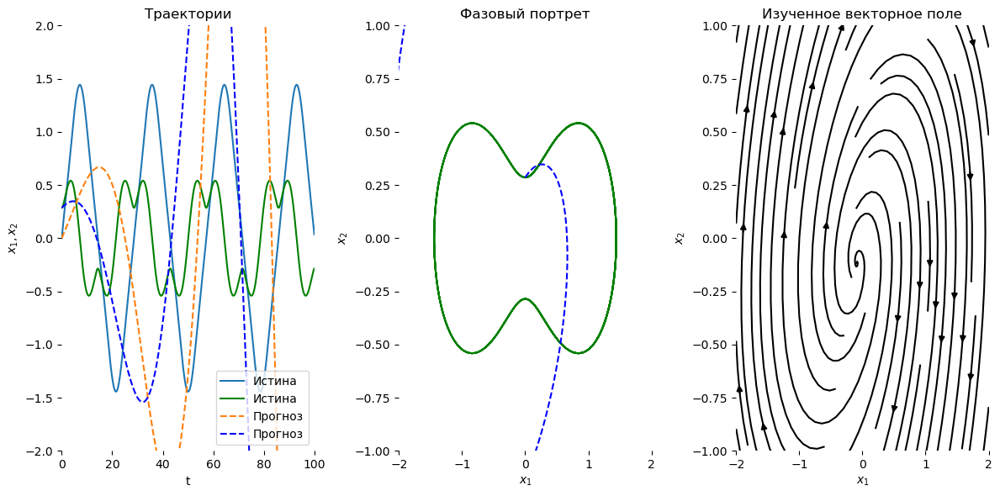

Best model on Iter 0027 with loss 0.010653
Iter 0027 | Total Loss 2.798864


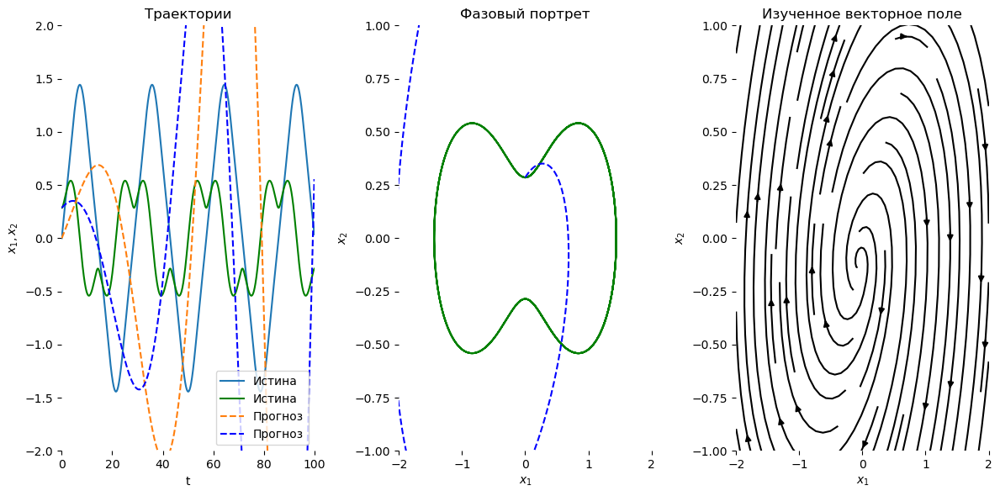

Best model on Iter 0028 with loss 0.010642
Iter 0028 | Total Loss 2.592782


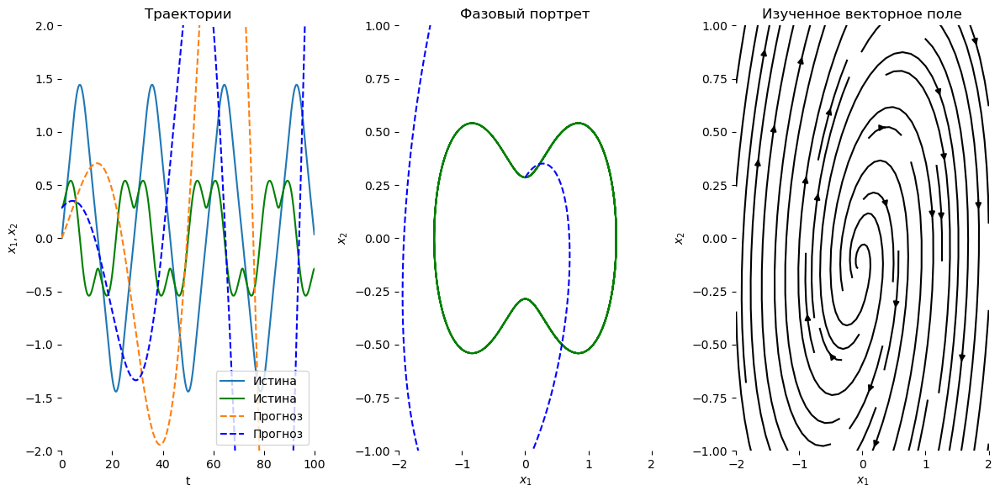

Best model on Iter 0030 with loss 0.010366
Iter 0030 | Total Loss 2.219162


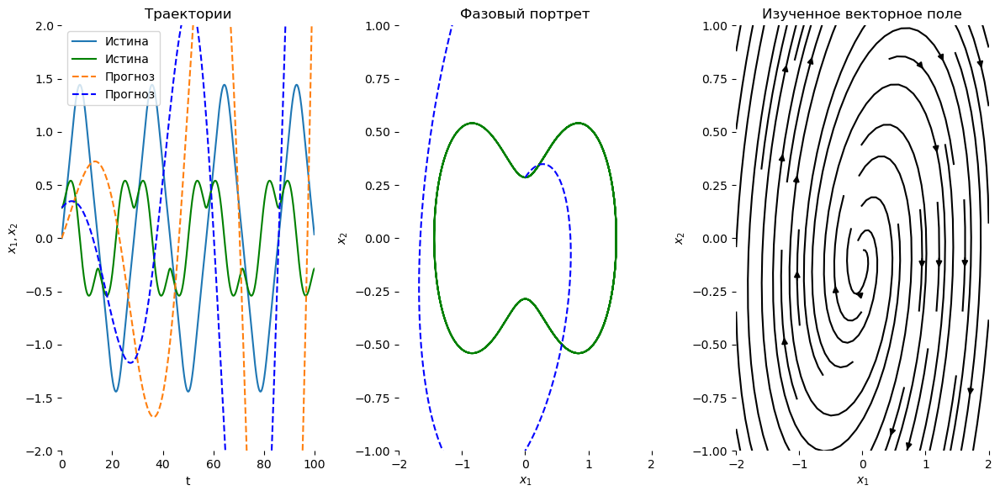

Best model on Iter 0031 with loss 0.010166
Iter 0031 | Total Loss 2.104424


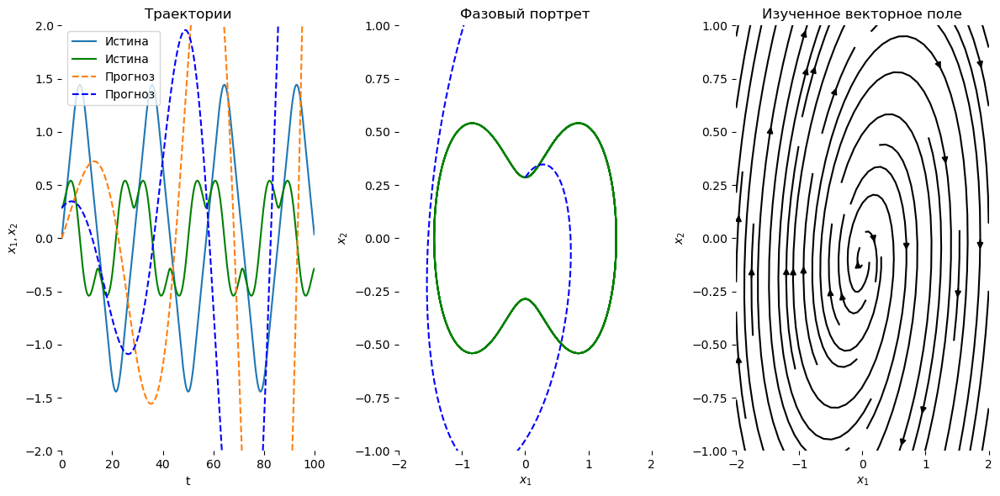

Best model on Iter 0034 with loss 0.010138
Iter 0034 | Total Loss 1.868917


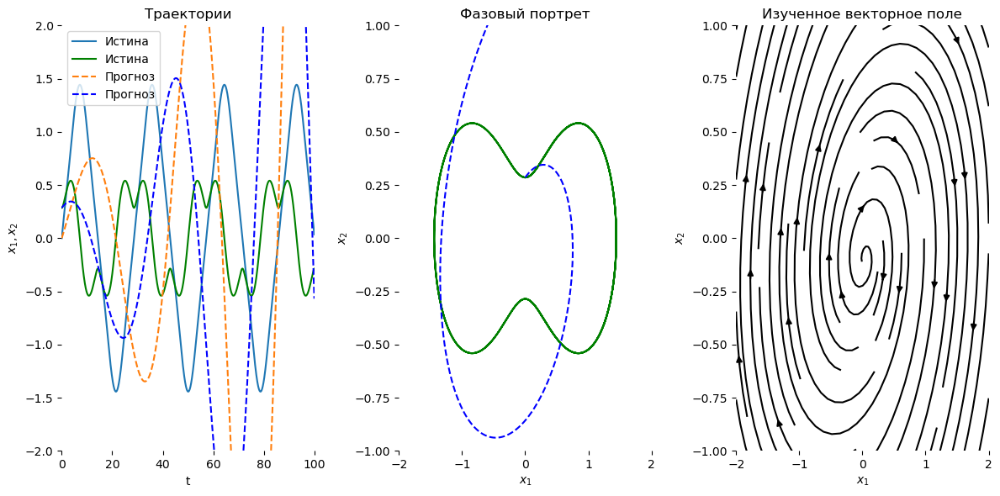

Best model on Iter 0035 with loss 0.009608
Iter 0035 | Total Loss 1.801390


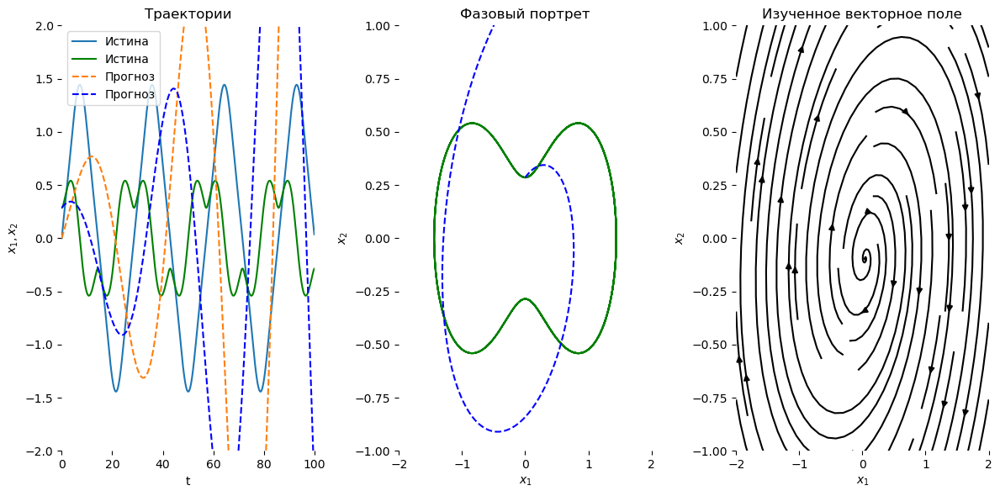

Best model on Iter 0036 with loss 0.009347
Iter 0036 | Total Loss 1.792320


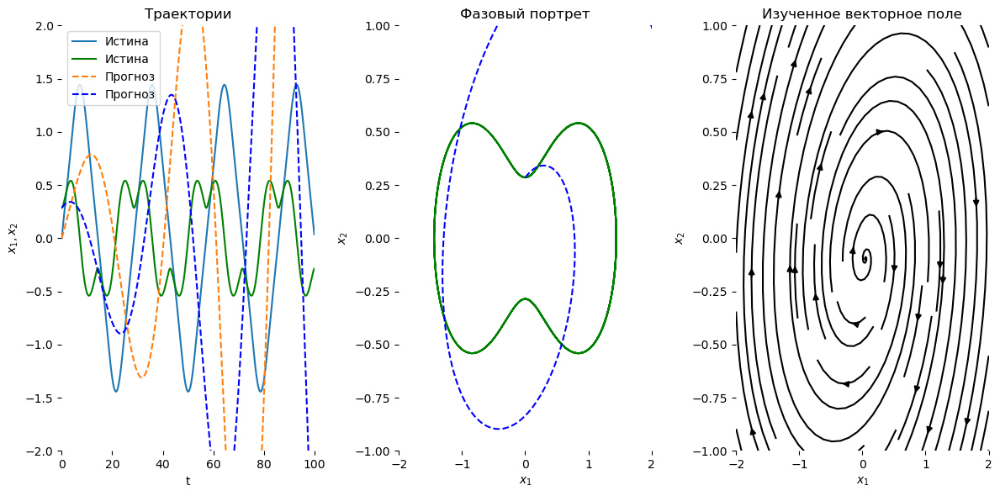

Best model on Iter 0037 with loss 0.009034
Iter 0037 | Total Loss 1.752389


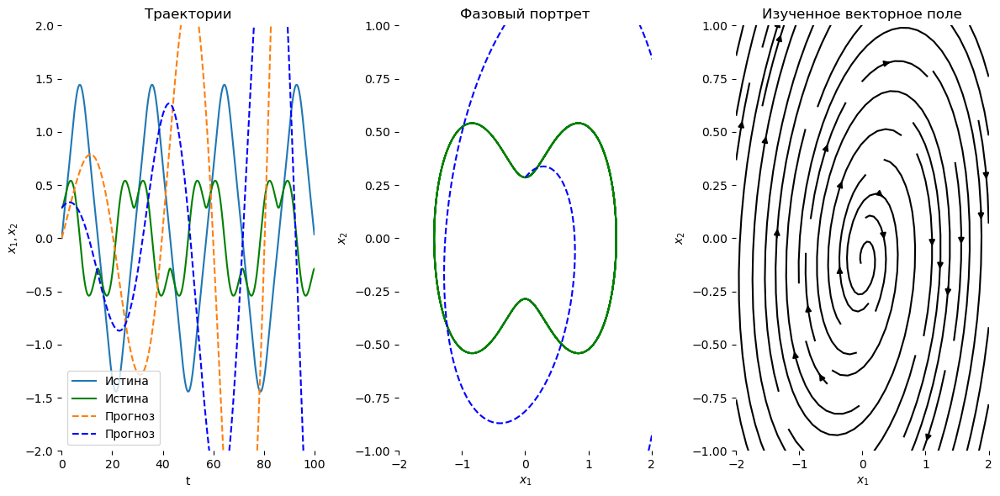

Best model on Iter 0040 with loss 0.008478
Iter 0040 | Total Loss 1.799313


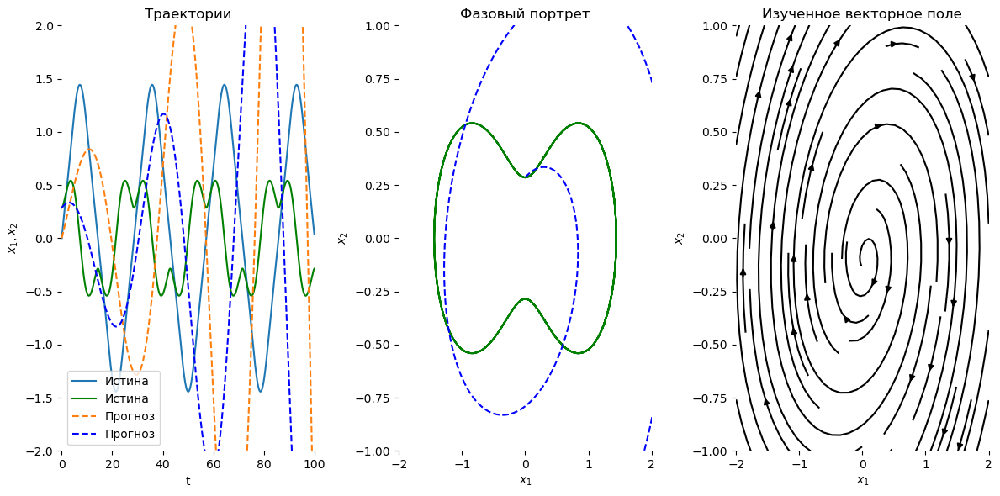

Best model on Iter 0043 with loss 0.008273
Iter 0043 | Total Loss 1.965191


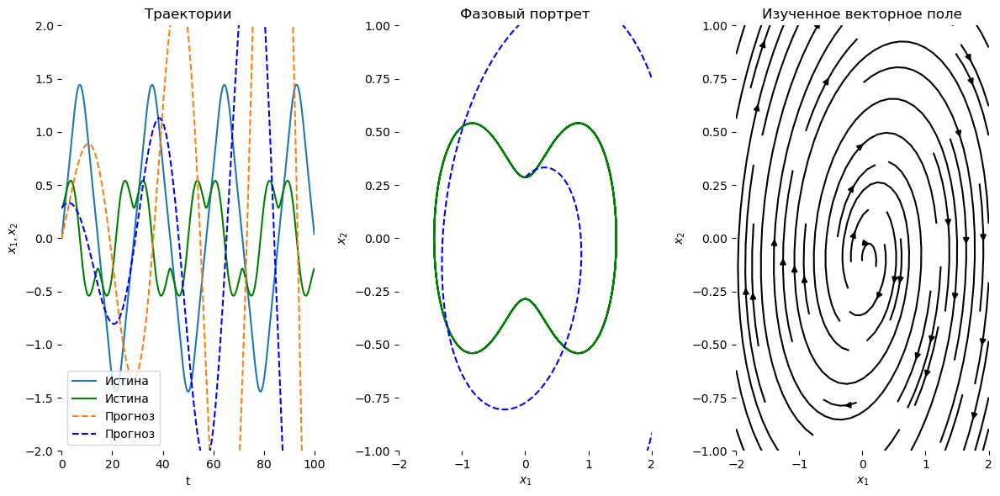

Best model on Iter 0045 with loss 0.008186
Iter 0045 | Total Loss 1.969335


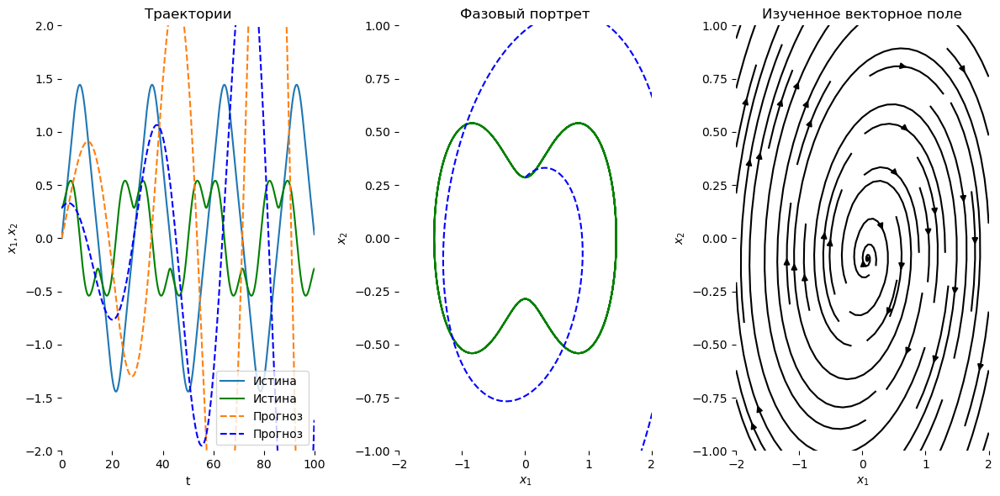

Best model on Iter 0046 with loss 0.007969
Iter 0046 | Total Loss 1.931736


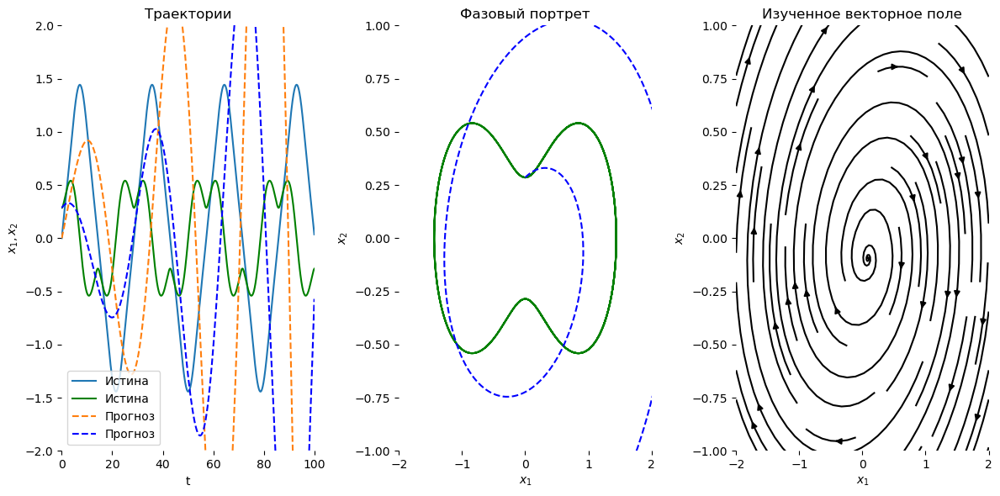

Best model on Iter 0047 with loss 0.007576
Iter 0047 | Total Loss 1.862806


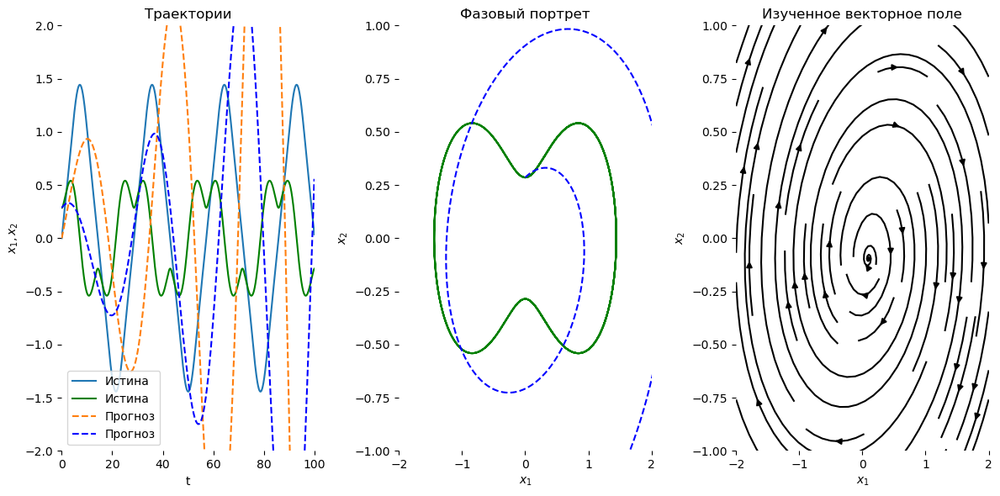

Best model on Iter 0048 with loss 0.007352
Iter 0048 | Total Loss 1.800512


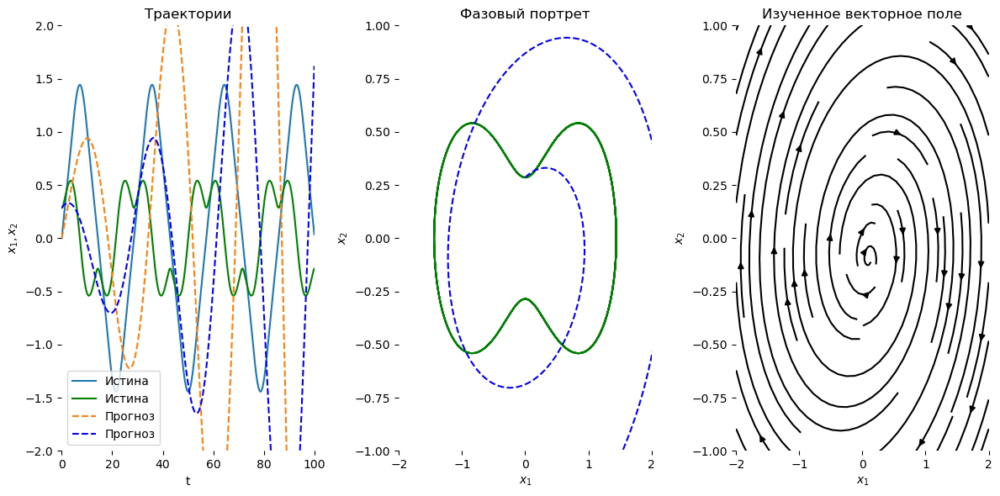

Best model on Iter 0050 with loss 0.007223
Iter 0050 | Total Loss 1.678540


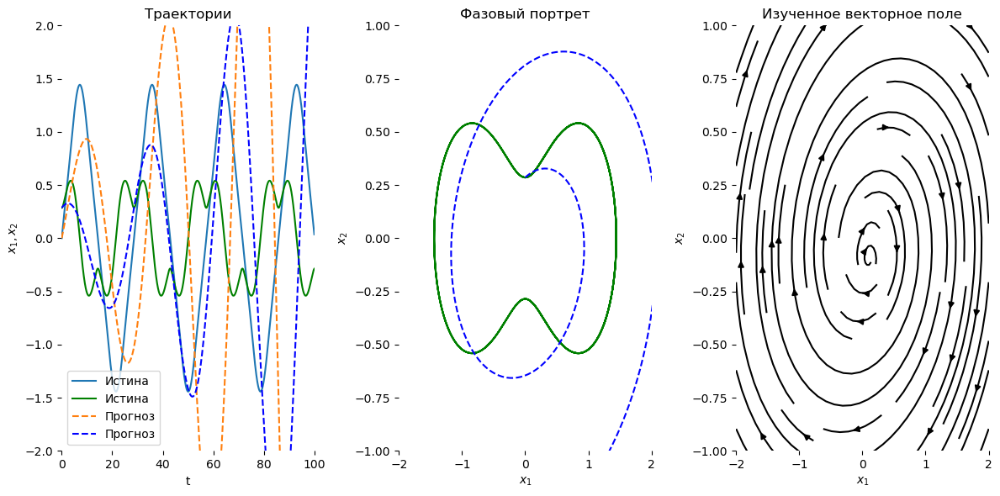

Best model on Iter 0051 with loss 0.006793
Iter 0051 | Total Loss 1.610200


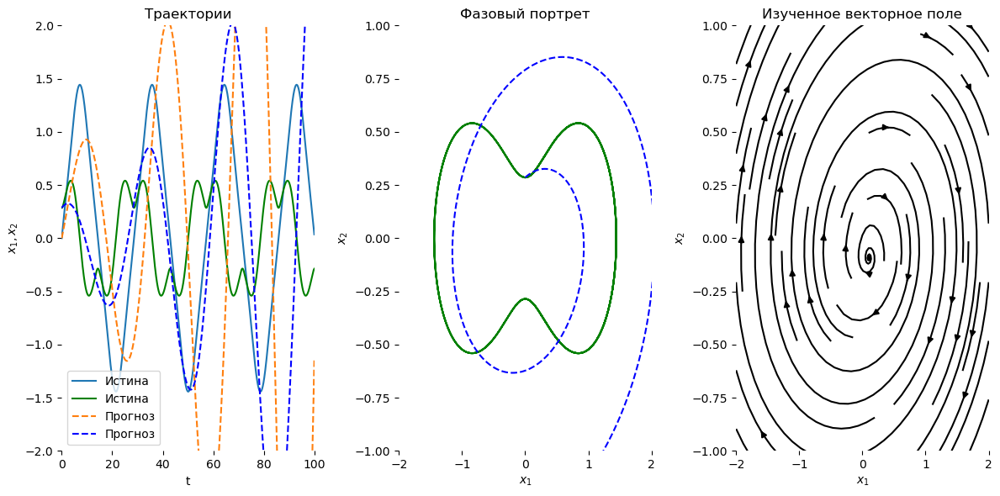

Best model on Iter 0054 with loss 0.006273
Iter 0054 | Total Loss 1.254917


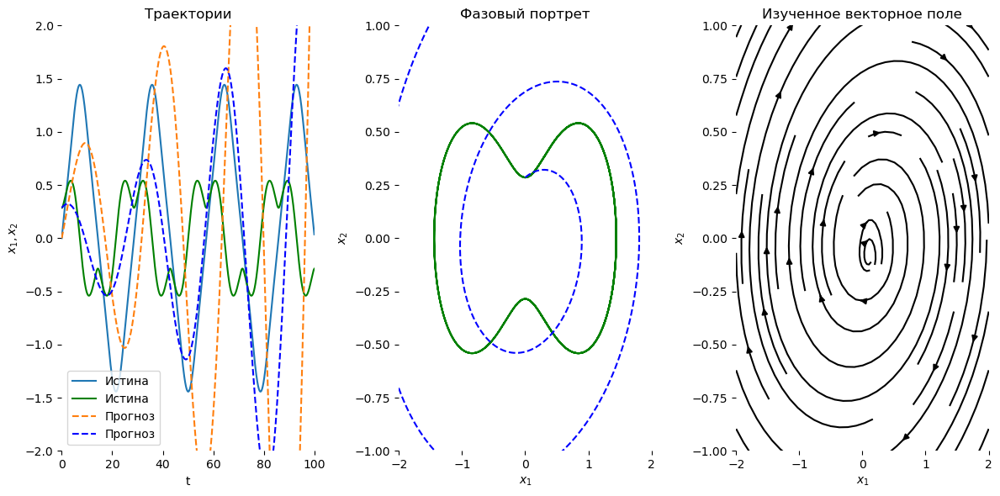

Best model on Iter 0056 with loss 0.005831
Iter 0056 | Total Loss 0.995649


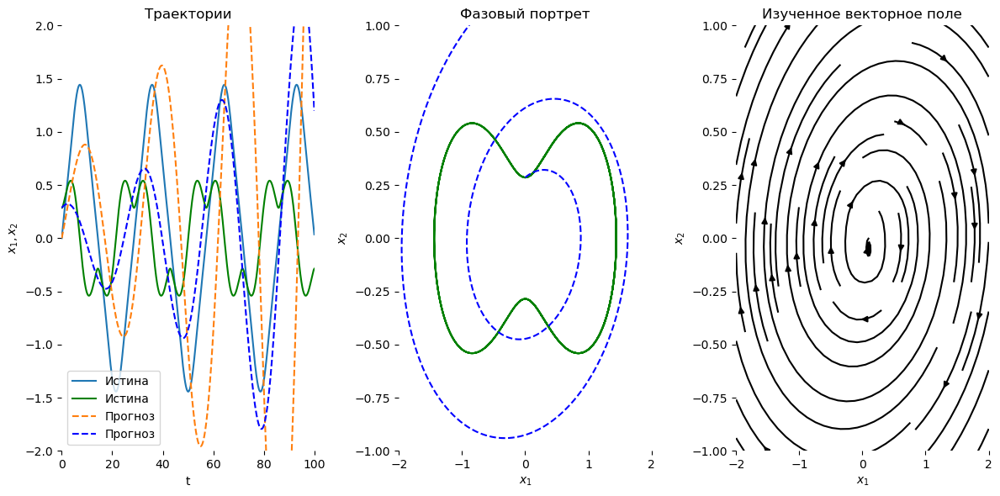

Best model on Iter 0059 with loss 0.005654
Iter 0059 | Total Loss 0.673643


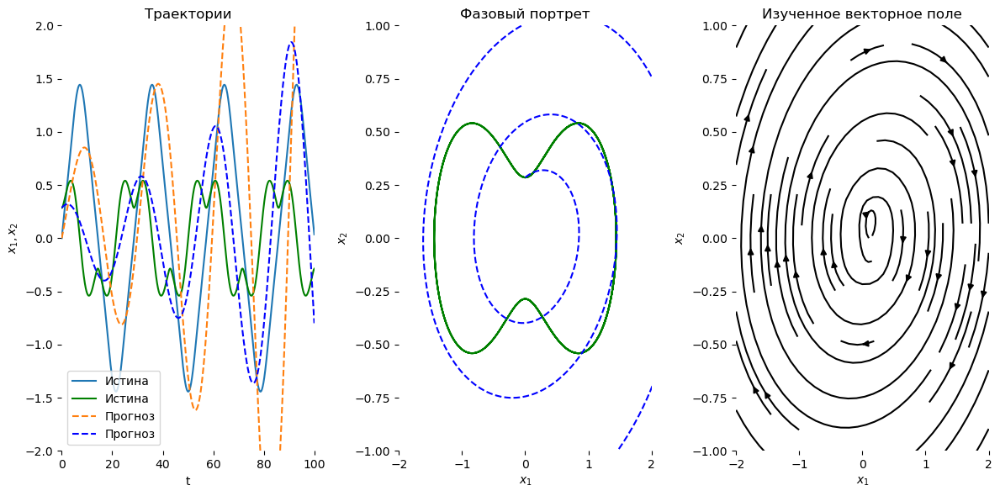

Best model on Iter 0060 with loss 0.005569
Iter 0060 | Total Loss 0.600008


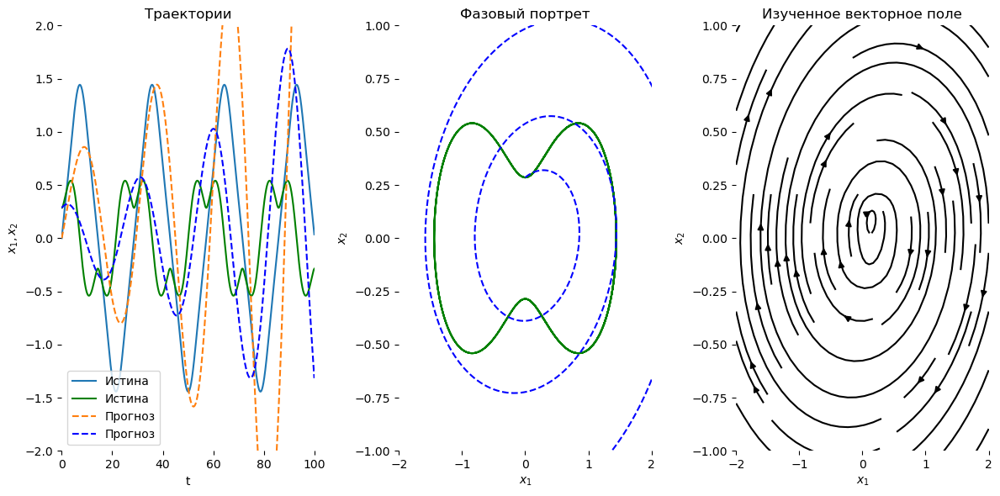

Best model on Iter 0061 with loss 0.005246
Iter 0061 | Total Loss 0.566228


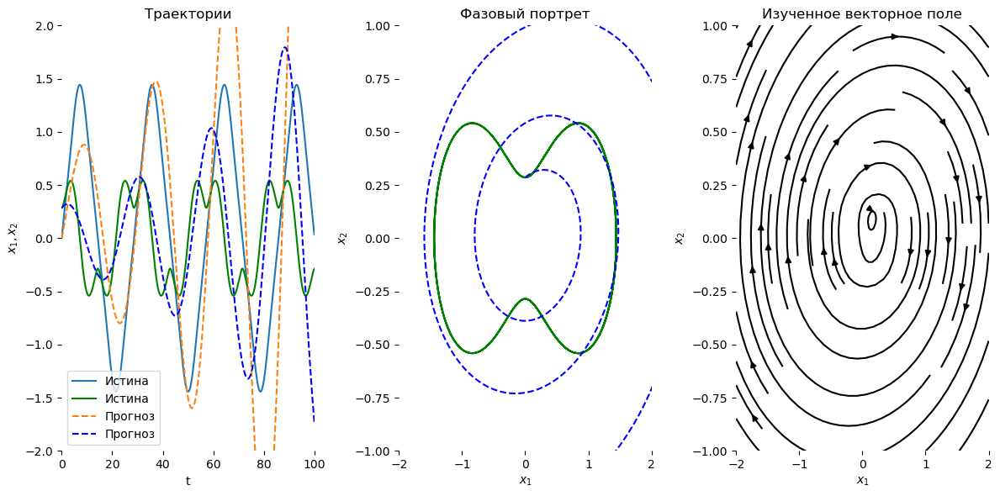

Best model on Iter 0063 with loss 0.004670
Iter 0063 | Total Loss 0.599739


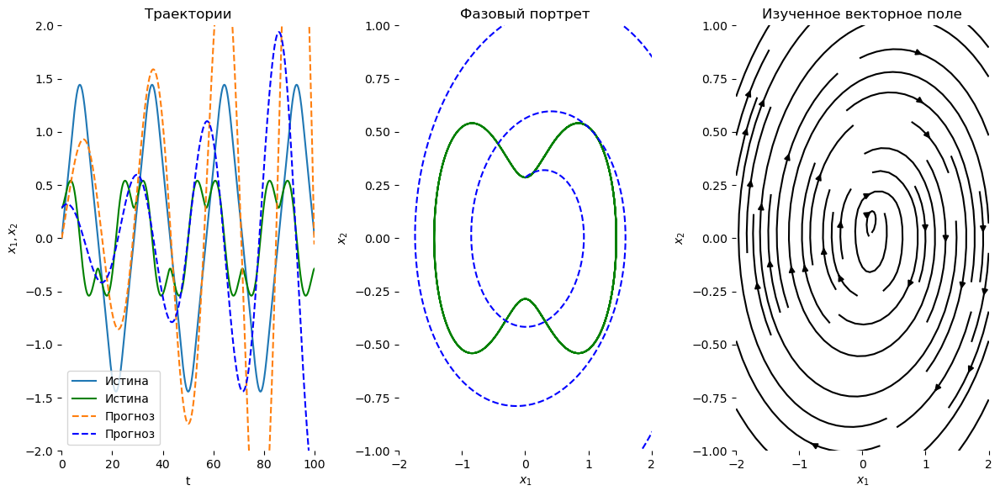

Best model on Iter 0064 with loss 0.004629
Iter 0064 | Total Loss 0.631004


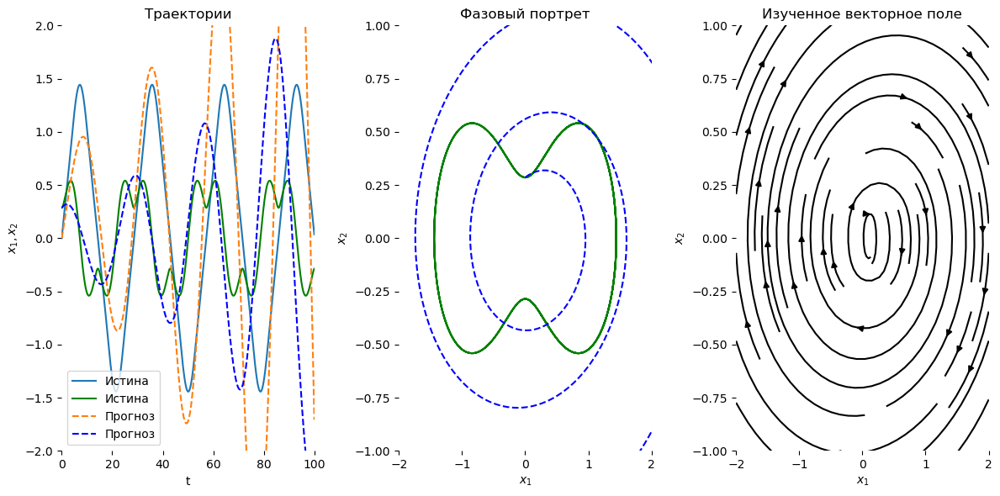

Best model on Iter 0077 with loss 0.004480
Iter 0077 | Total Loss 0.473313


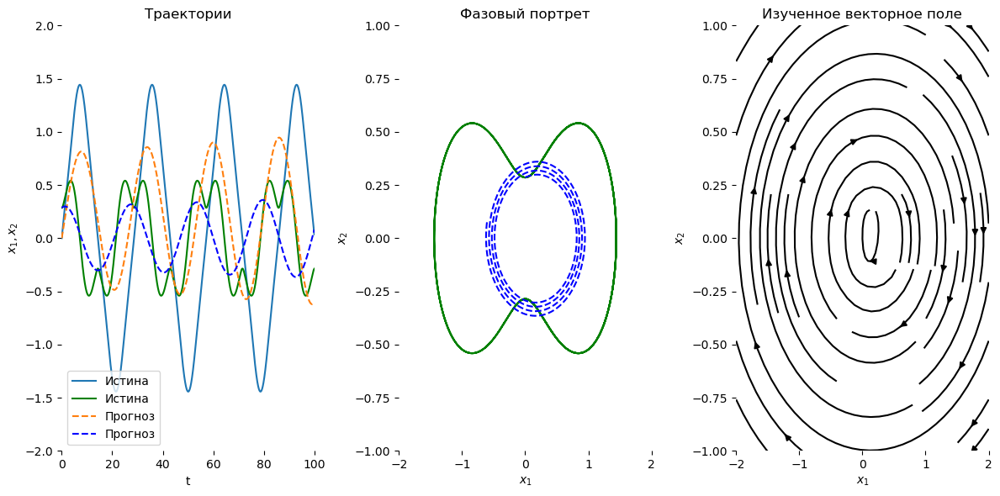

Best model on Iter 0084 with loss 0.004204
Iter 0084 | Total Loss 0.494121


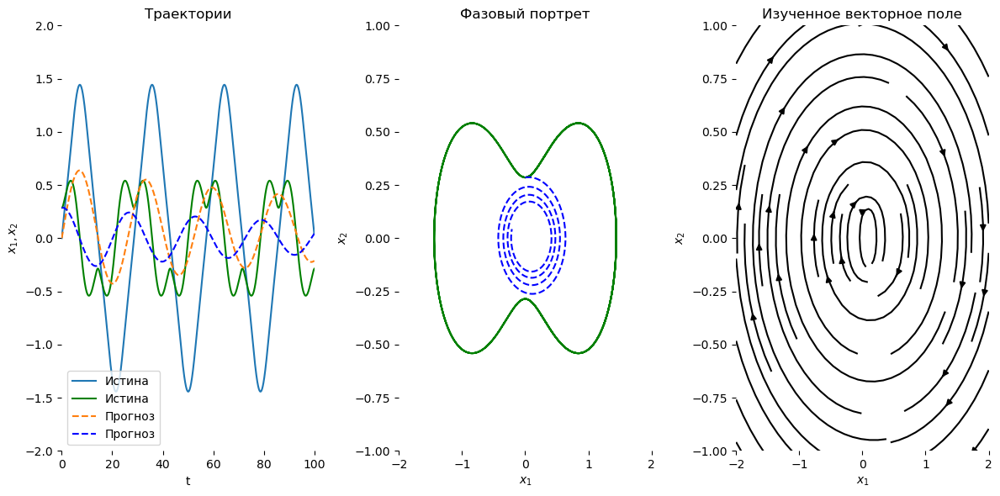

Best model on Iter 0204 with loss 0.004151
Iter 0204 | Total Loss 0.340647


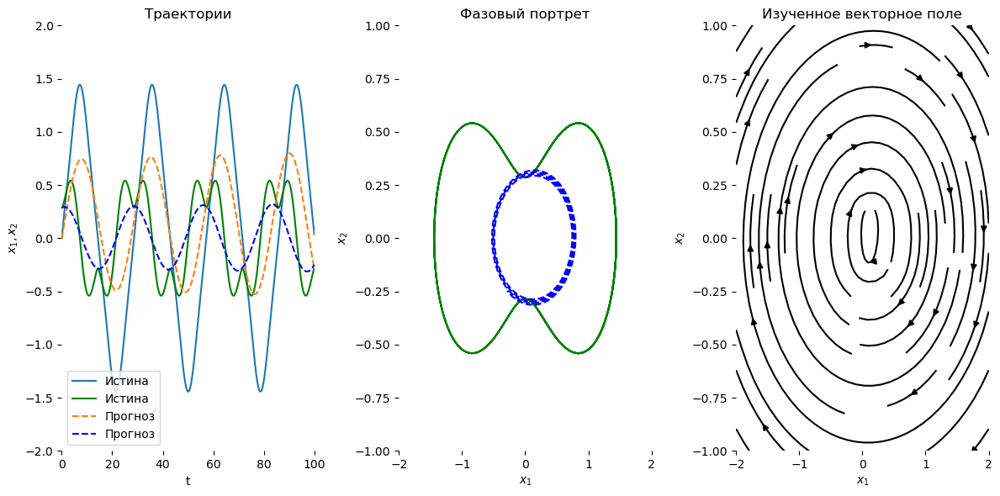

Best model on Iter 0235 with loss 0.004057
Iter 0235 | Total Loss 0.426220


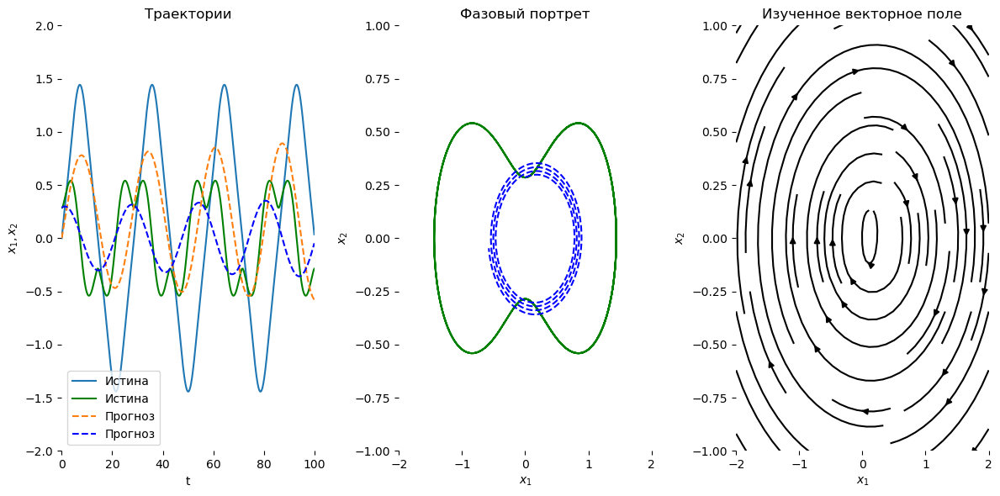

Best model on Iter 0956 with loss 0.004047
Iter 0956 | Total Loss 0.388804


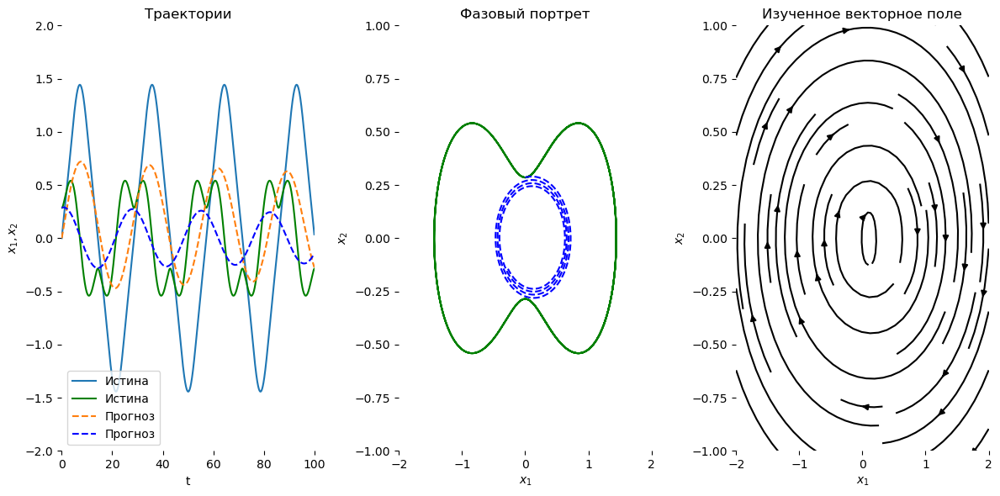

Best model on Iter 1071 with loss 0.004030
Iter 1071 | Total Loss 0.285927


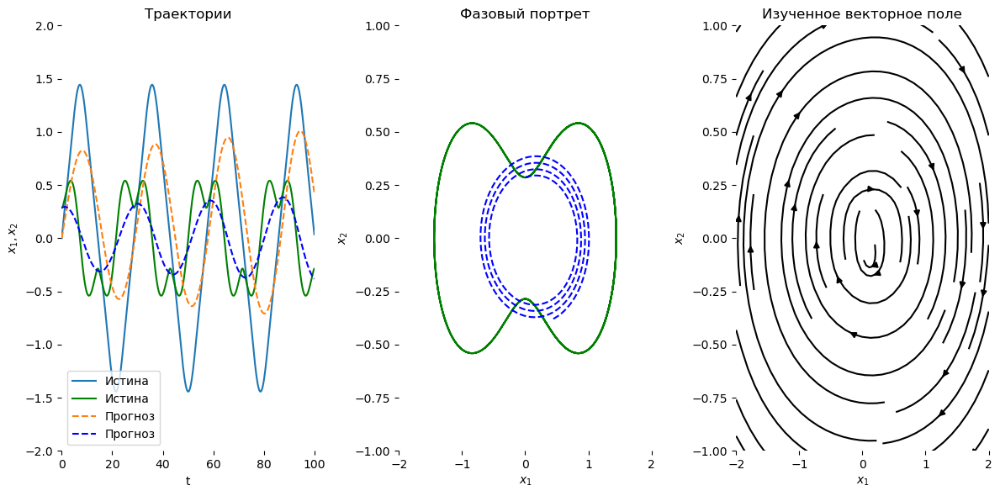

Best model on Iter 1086 with loss 0.003947
Iter 1086 | Total Loss 0.214878


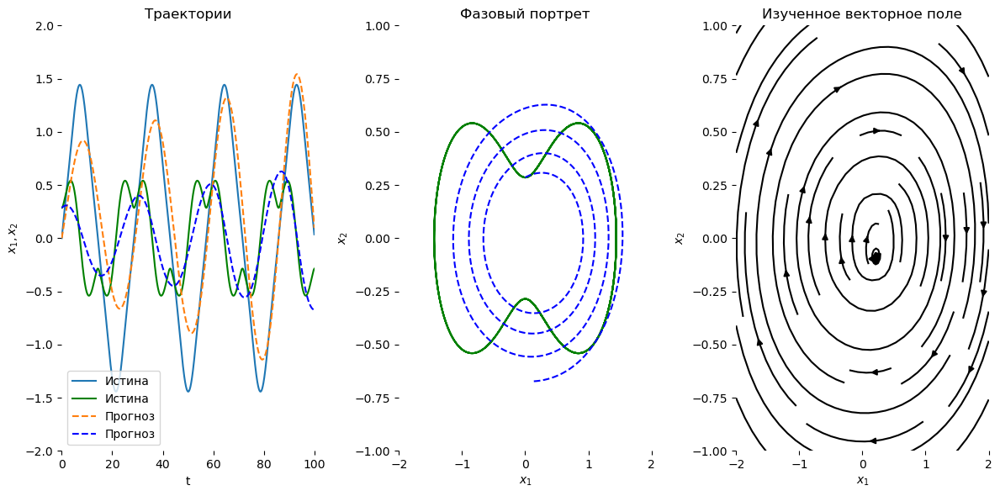

Best model on Iter 1142 with loss 0.003830
Iter 1142 | Total Loss 0.314276


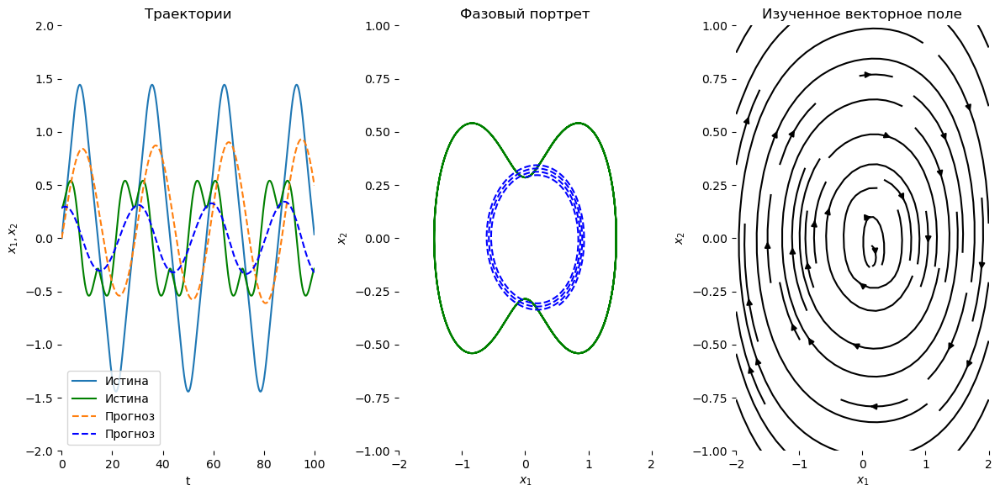

Best model on Iter 1217 with loss 0.003578
Iter 1217 | Total Loss 0.595235


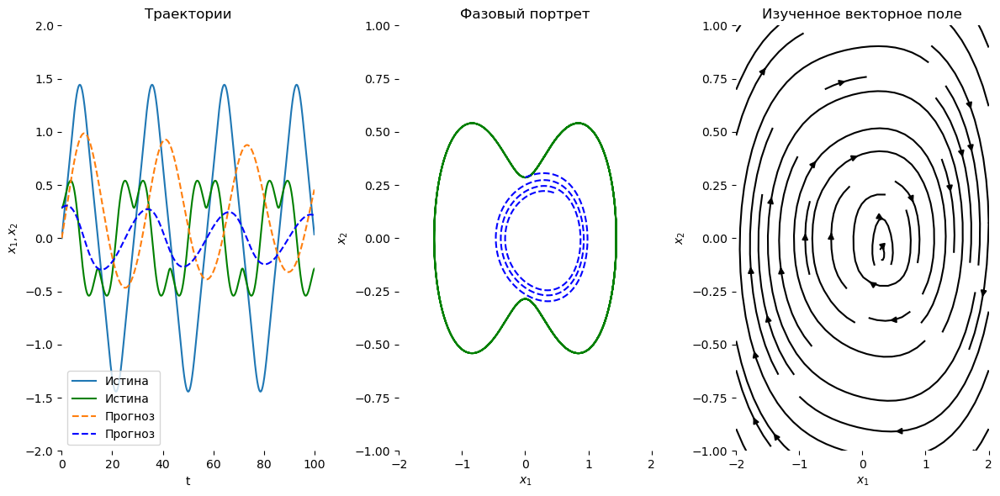

Best model on Iter 1248 with loss 0.003560
Iter 1248 | Total Loss 0.423201


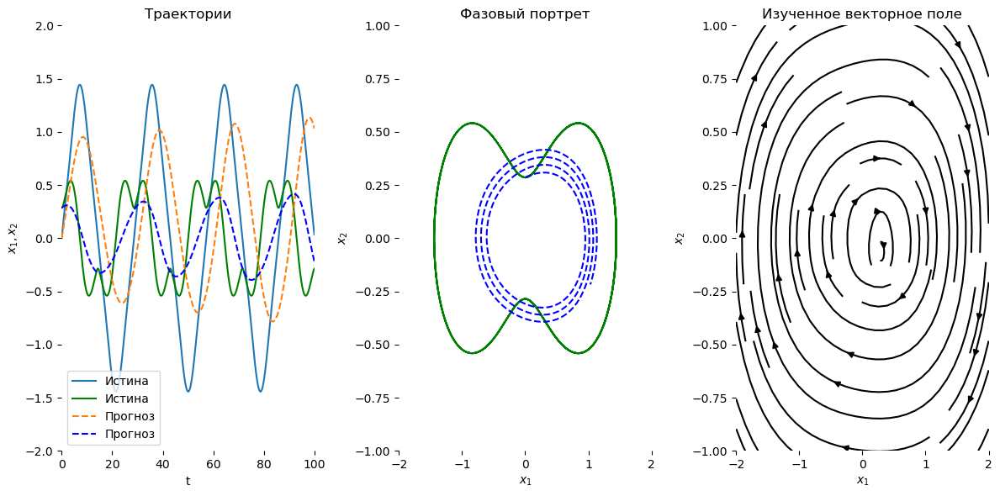

Best model on Iter 1271 with loss 0.003377
Iter 1271 | Total Loss 0.569305


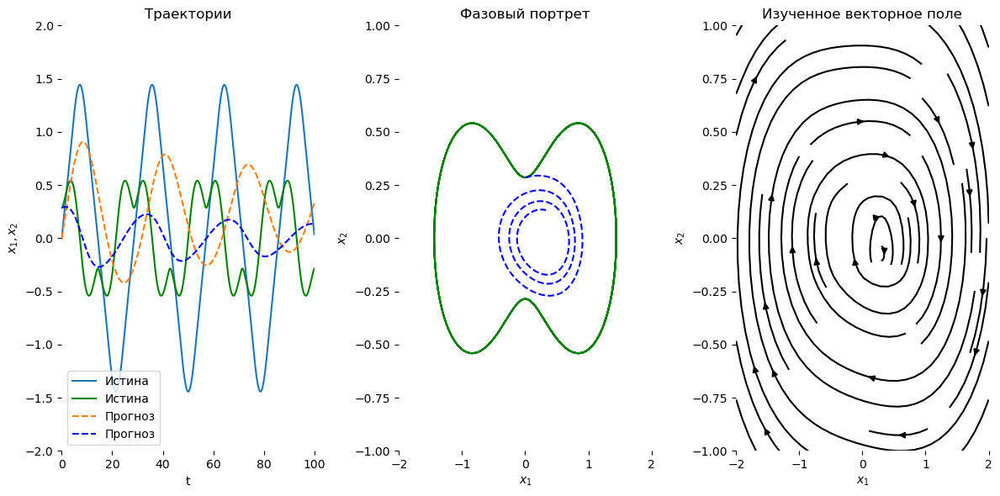

Best model on Iter 1307 with loss 0.003272
Iter 1307 | Total Loss 0.491359


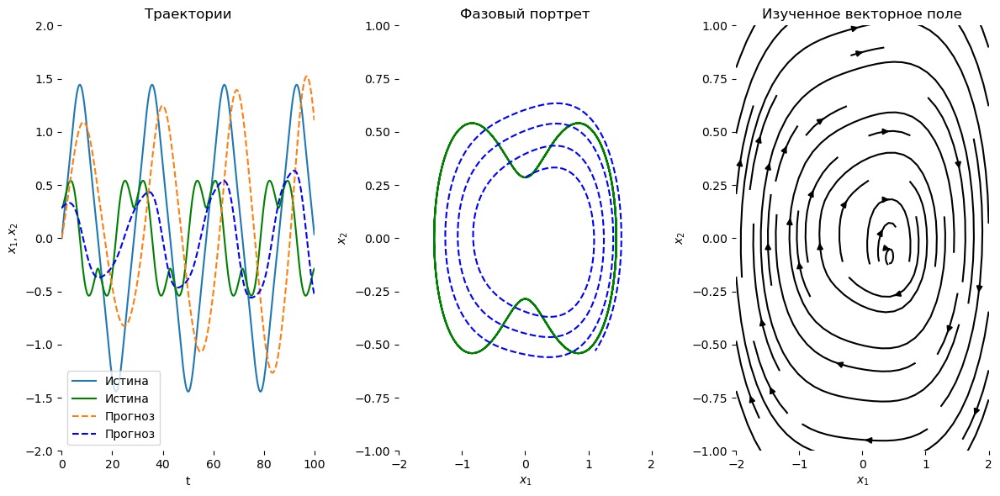

Best model on Iter 1332 with loss 0.003157
Iter 1332 | Total Loss 0.557935


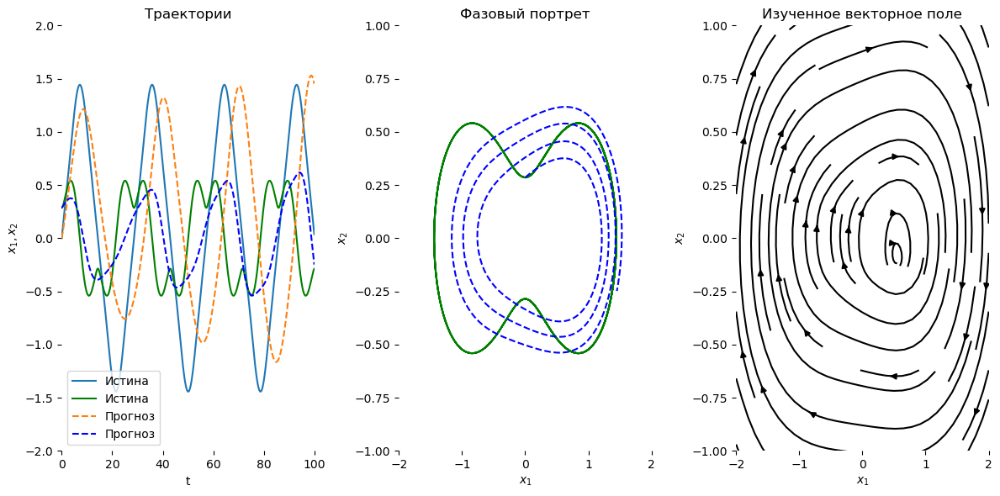

Best model on Iter 1352 with loss 0.002735
Iter 1352 | Total Loss 0.277481


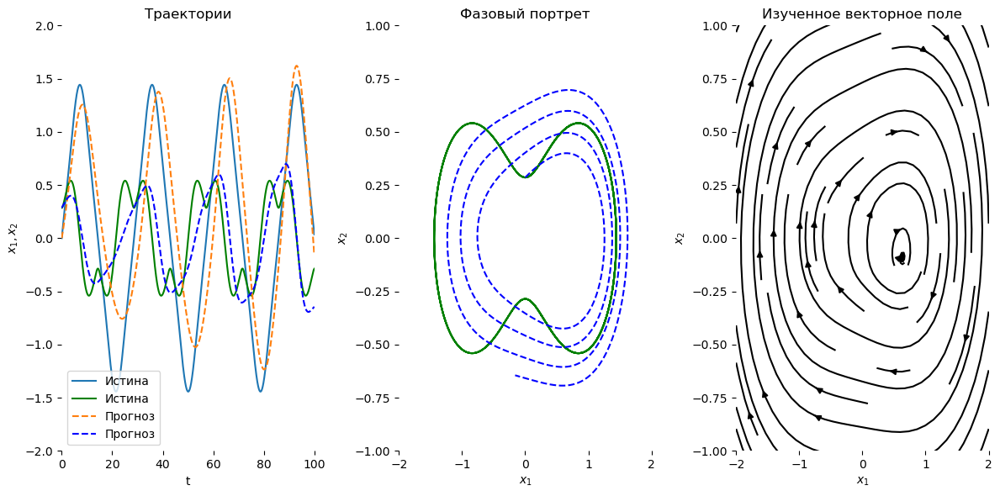

Best model on Iter 1369 with loss 0.002624
Iter 1369 | Total Loss 0.648515


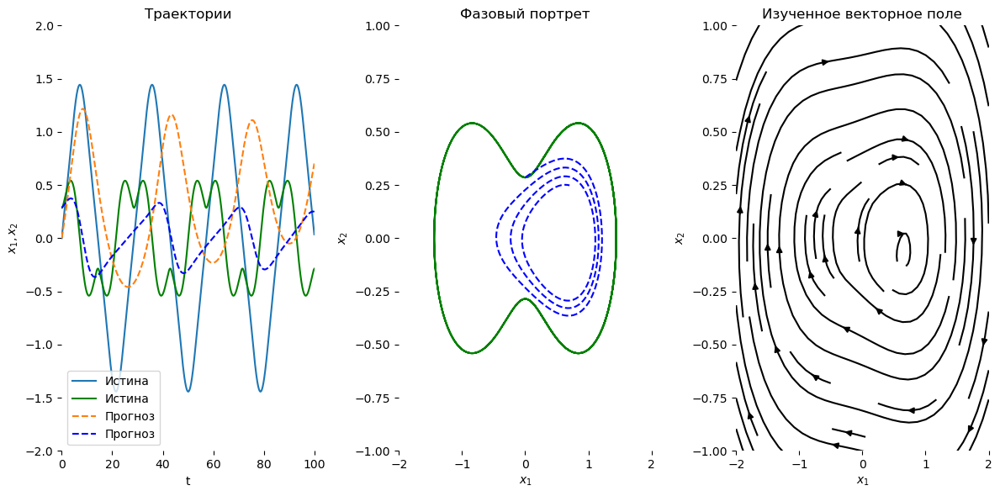

Best model on Iter 1400 with loss 0.002563
Iter 1400 | Total Loss 0.450651


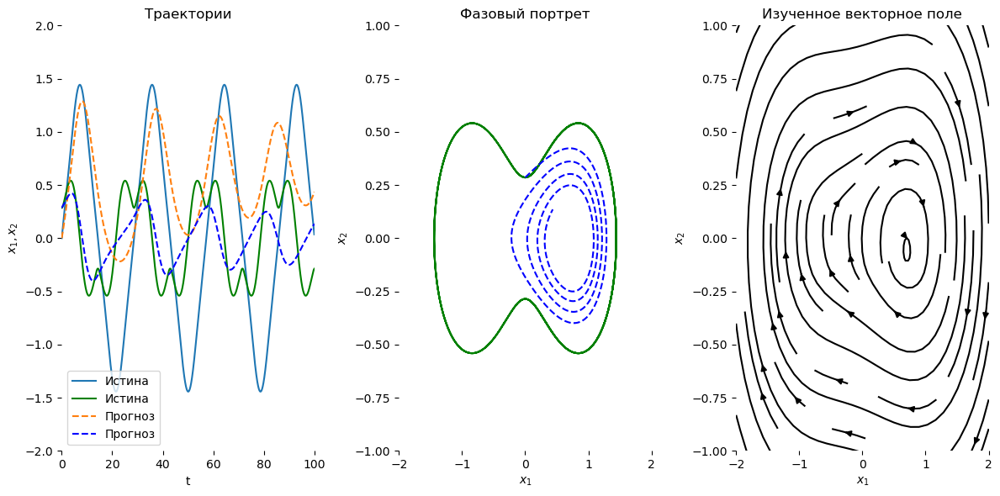

Best model on Iter 1404 with loss 0.002452
Iter 1404 | Total Loss 0.725412


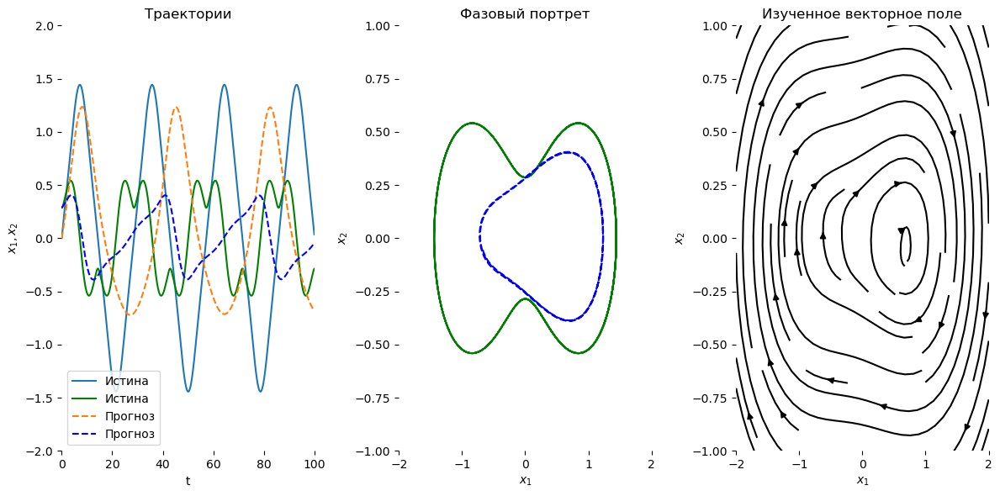

Best model on Iter 1411 with loss 0.002277
Iter 1411 | Total Loss 0.349042


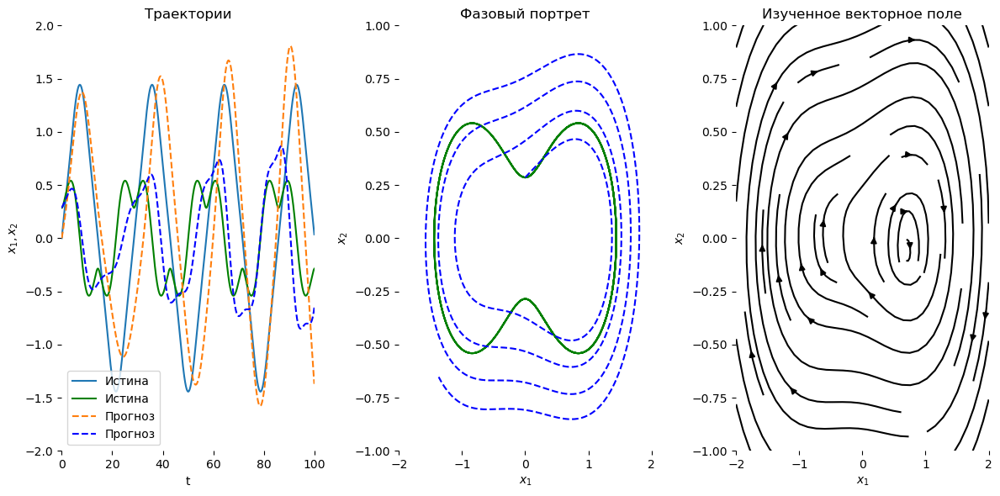

Best model on Iter 1437 with loss 0.002053
Iter 1437 | Total Loss 0.750148


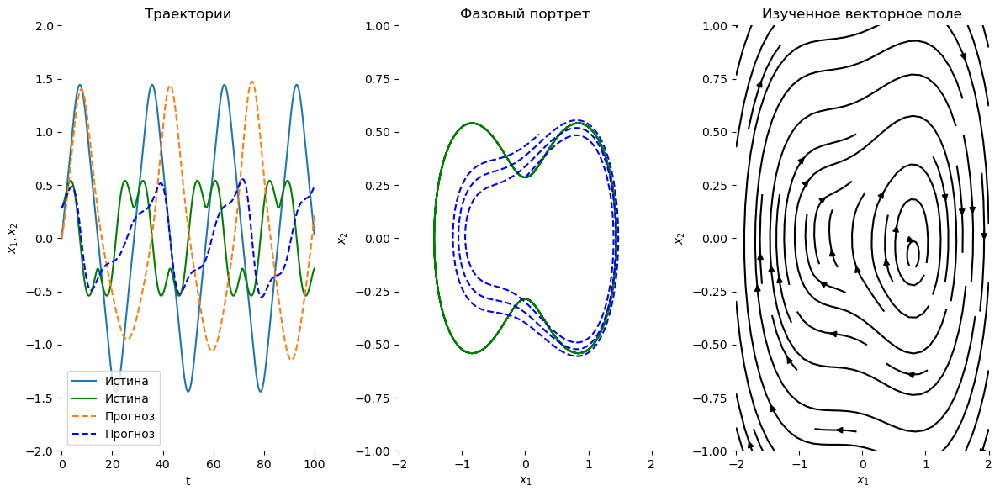

Best model on Iter 1444 with loss 0.001668
Iter 1444 | Total Loss 0.457400


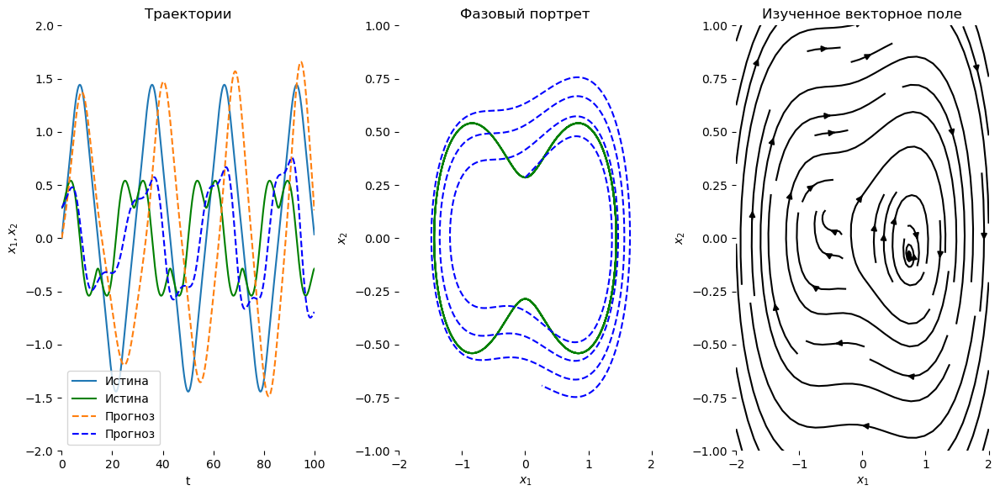

Best model on Iter 1488 with loss 0.001602
Iter 1488 | Total Loss 0.693346


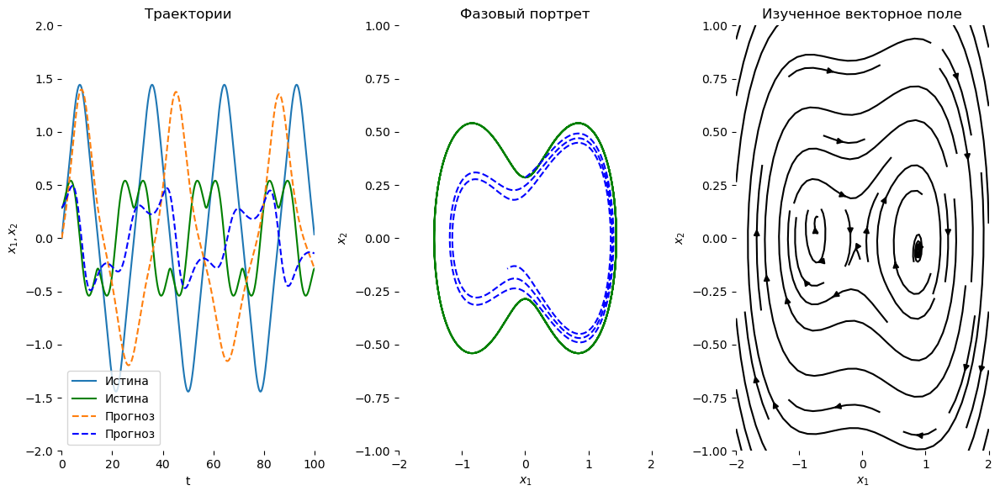

Best model on Iter 1498 with loss 0.001584
Iter 1498 | Total Loss 0.287259


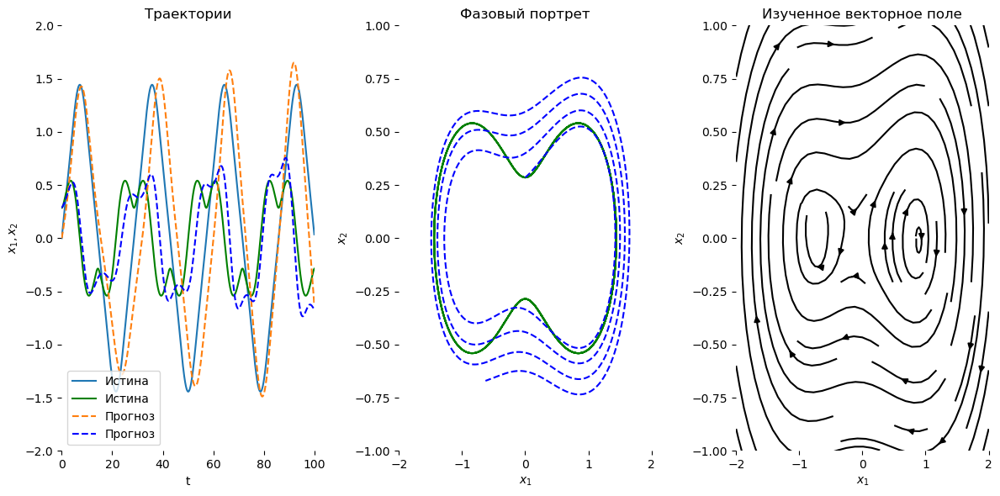

Best model on Iter 1501 with loss 0.001434
Iter 1501 | Total Loss 0.680956


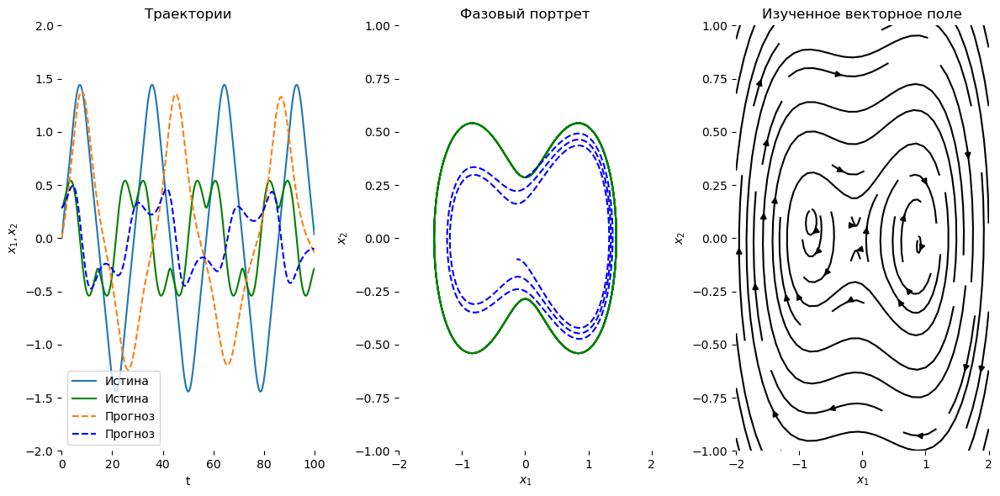

Best model on Iter 1586 with loss 0.001296
Iter 1586 | Total Loss 0.752455


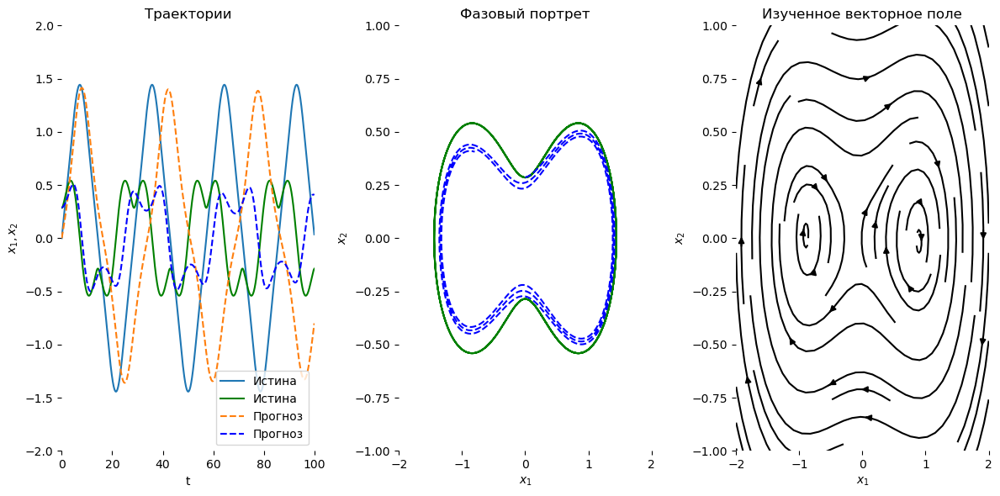

Best model on Iter 1724 with loss 0.001243
Iter 1724 | Total Loss 0.266409


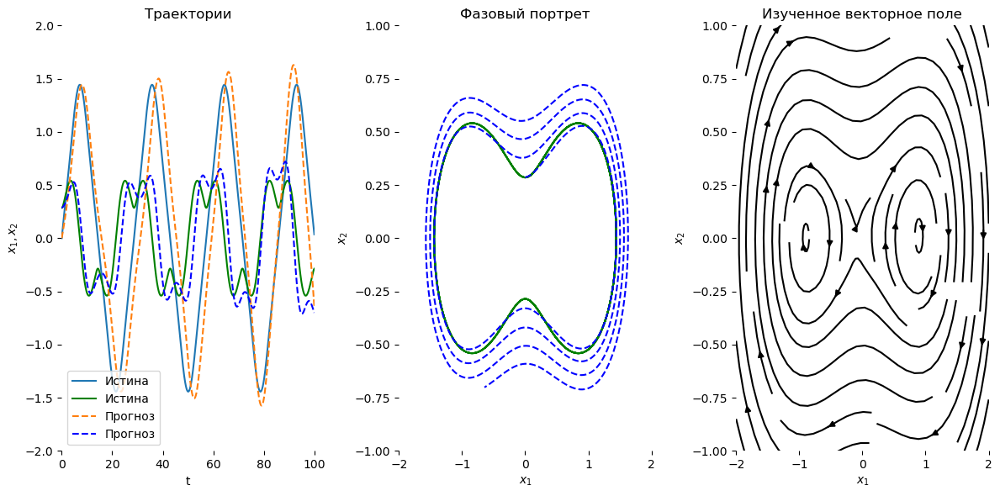

In [8]:
ii = 0

func = ODEFunc().to(device)

#optimizer = optim.RMSprop(func.parameters(), lr=1e-3)
optimizer = optim.Adam(func.parameters(), lr=1e-3)
end = time.time()

time_meter = RunningAverageMeter(0.97)

loss_meter = RunningAverageMeter(0.97)

best_loss = np.inf
loss_arr = np.zeros((2,niters))
for itr in range(1, niters + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch()
    pred_y = odeint(func, batch_y0, batch_t).to(device)
    loss = torch.mean(torch.abs(pred_y - batch_y))
    loss_arr[0,itr-1] = itr
    loss_arr[1,itr-1] = loss.item()

    if loss.item() < best_loss:
        torch.save(func.state_dict(), "best_model.pth")
        print(f"Best model on Iter {itr:04d} with loss {loss.item():.6f}")
         
    loss.backward()
    optimizer.step()

    time_meter.update(time.time() - end)
    loss_meter.update(loss.item())

    if loss.item() < best_loss: #itr % test_freq == 0:
        best_loss = loss.item()
        with torch.no_grad():
            pred_y = odeint(func, true_y0, t)
            loss = torch.mean(torch.abs(pred_y - true_y))
            print('Iter {:04d} | Total Loss {:.6f}'.format(
                itr, loss.item())
            )
            visualize(true_y, pred_y, func, ii)
            ii += 1

            
    end = time.time()

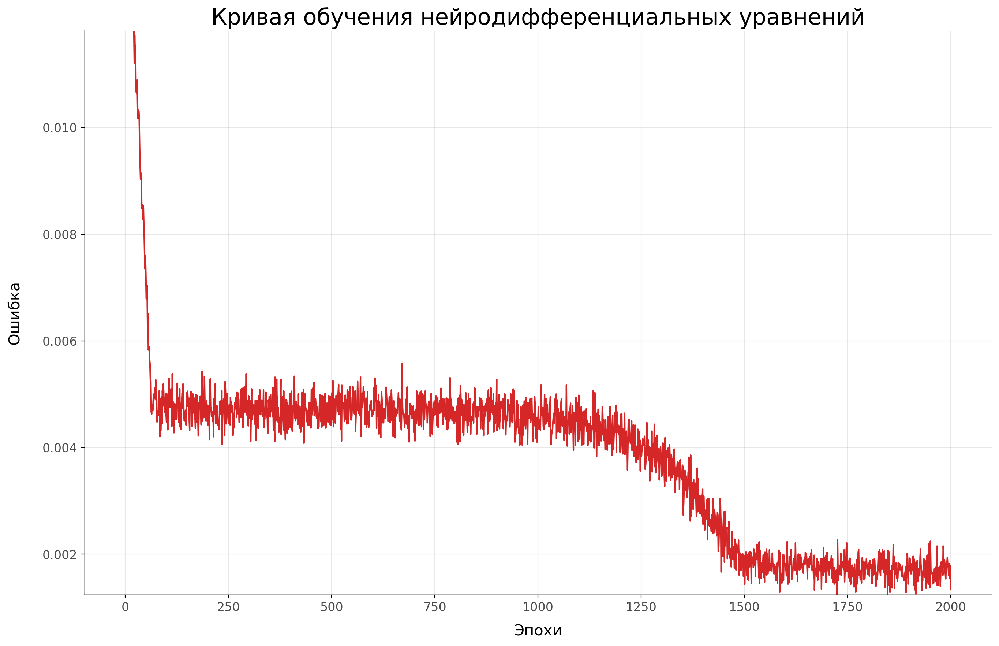

In [9]:
# Draw Plot
plt.figure(figsize=(16,10), dpi= 200)
plt.plot(loss_arr[0,:], loss_arr[1,:], color='tab:red')

# Decoration
plt.xticks(
    rotation=0, fontsize=12, horizontalalignment='center', alpha=.7
)
plt.yticks(fontsize=12, alpha=.7)
plt.ylim(ymin=loss_arr[1,:].min(),ymax=np.quantile(loss_arr[1,:],0.99)) # np.quantile(loss_arr[1,:],0.965)
plt.xlabel(r"Эпохи", fontsize=15, labelpad=10)
plt.ylabel(r"Ошибка", fontsize=15, labelpad=20)
plt.title("Кривая обучения нейродифференциальных уравнений", fontsize=22)
plt.grid(axis='both', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.3)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.3)   
plt.savefig('nODE_learning_curve.pdf', dpi=1200)
plt.show()

In [10]:
#torch.save(func.state_dict(), "best_model.pth")

In [11]:
#func = torch.load("best_model.pth")

/var/folders/17/3qzjrpyx1m3fyc0k390k2l940000gp/T/ipykernel_52996/3342478953.py:21: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2),
/var/folders/17/3qzjrpyx1m3fyc0k390k2l940000gp/T/ipykernel_52996/3342478953.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  np.sqrt(x1**2*(x1**2+x2**2-c**2)**2+x2**2*(x1**2+x2**2+c**2)**2)


Total Loss 0.377587


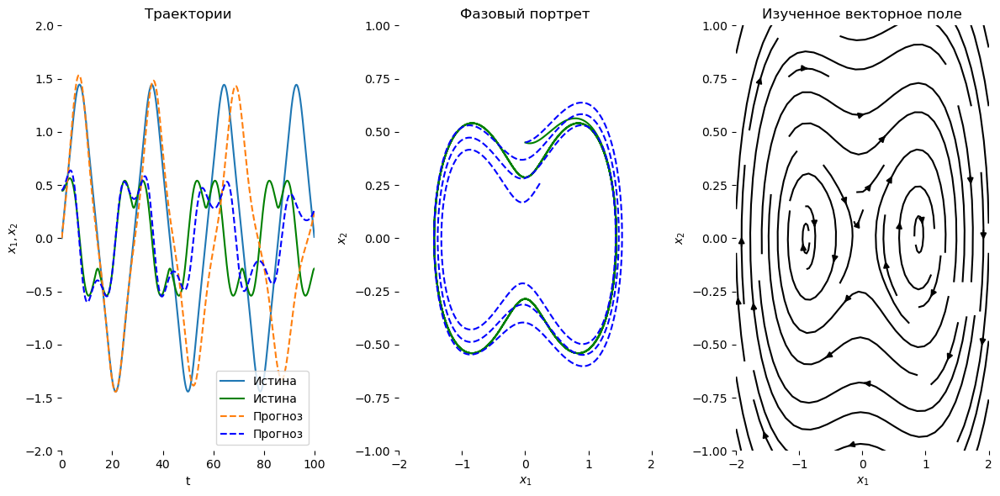

In [12]:
trueSh_y0 = torch.tensor([[0., 0.45]]).to(device)

with torch.no_grad():
    trueSh_y = odeint(Lambda(), trueSh_y0, t, method='dopri5')


with torch.no_grad():
    predSh_y = odeint(func, trueSh_y0, t)
    lossSh = torch.mean(torch.abs(predSh_y - trueSh_y))
    print('Total Loss {:.6f}'.format(
        lossSh.item())
    )
    visualize(trueSh_y, predSh_y, func, 0)
